In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier


from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
import joblib
import warnings
warnings.filterwarnings('ignore')

In [3]:
pd.set_option("display.max_rows",None)
pd.set_option('display.max_columns', None)


In [3]:
#importing Dataset
df=pd.read_csv('weatherAUS.csv')


In [4]:
df.head(50)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,19.0,24.0,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No
6,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,SW,W,20.0,24.0,49.0,19.0,1009.6,1008.2,1.0,NaN,18.1,24.6,No,No
7,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,W,6.0,17.0,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,No
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,NW,7.0,28.0,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes
9,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,S,SSE,15.0,11.0,58.0,27.0,1007.0,1005.7,NaN,NaN,20.1,28.2,Yes,No


In [5]:
#shape of the dataset
df.shape

(8425, 23)

In [6]:
#we can see there are 8425 rows and 23 columns in the dataset

In [7]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [9]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

we can see many missing values in the dataset

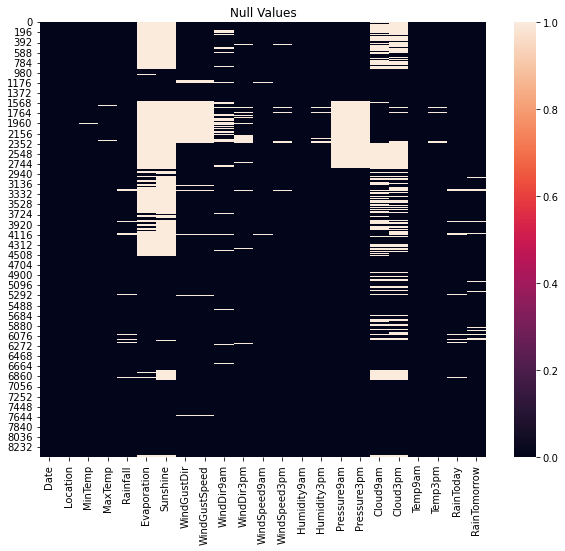

In [10]:
# heatmap on null values
plt.figure(figsize=[10,8])
sns.heatmap(df.isnull())
plt.title("Null Values")
plt.show()

We are able to see null values in the columns except Date and Location in the dataset

# 1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.


In [4]:
#duplicates removal
df.drop_duplicates(inplace=True)
df.shape

(6762, 23)

We have removed the duplicates from the dataset.

In [5]:
#changing Date to datetime format for Date
df['Date']=pd.to_datetime(df['Date'])
df["Month"]=df["Date"].dt.month
df["Day"]=df["Date"].dt.day
df["Year"]=df["Date"].dt.year

#dropping the Date column since we have the data of this column
df.drop('Date',axis=1,inplace=True)

# Filling missing values

In [6]:
#dropping the rows in  RainTomorrow having null values since it is the target variable and filling the values in it might influence the model so,
df.drop(df[df['RainTomorrow'].isnull()==True].index,inplace=True)

In [15]:
#updated datset
df.shape

(6624, 25)

In [16]:
df.isnull().sum()

Location            0
MinTemp            57
MaxTemp            35
Rainfall           66
Evaporation      2860
Sunshine         3163
WindGustDir       908
WindGustSpeed     908
WindDir9am        778
WindDir3pm        276
WindSpeed9am       51
WindSpeed3pm       83
Humidity9am        41
Humidity3pm        80
Pressure9am      1291
Pressure3pm      1292
Cloud9am         1789
Cloud3pm         1829
Temp9am            38
Temp3pm            76
RainToday          66
RainTomorrow        0
Month               0
Day                 0
Year                0
dtype: int64

In [17]:
df.RainTomorrow.isnull().sum()

0

In [7]:
#creating list of categorical column so that it can be filled with mode values depending up on the column
cat_imp=['WindGustDir','WindDir9am','WindDir3pm','RainToday']

In [8]:
#filling null values using function
def impu():
    for i in range(len(cat_imp)):
        df[cat_imp[i]] = df[cat_imp[i]].fillna(df[cat_imp[i]].mode()[0])

#calling the function        
impu()

In [21]:
#checking for null values
df[cat_imp].isnull().sum()

WindGustDir    0
WindDir9am     0
WindDir3pm     0
RainToday      0
dtype: int64

In [22]:
df.isnull().sum()

Location            0
MinTemp            57
MaxTemp            35
Rainfall           66
Evaporation      2860
Sunshine         3163
WindGustDir         0
WindGustSpeed     908
WindDir9am          0
WindDir3pm          0
WindSpeed9am       51
WindSpeed3pm       83
Humidity9am        41
Humidity3pm        80
Pressure9am      1291
Pressure3pm      1292
Cloud9am         1789
Cloud3pm         1829
Temp9am            38
Temp3pm            76
RainToday           0
RainTomorrow        0
Month               0
Day                 0
Year                0
dtype: int64

In [9]:
#creating list for contious values column to fill with mean
cont_imp=['MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm',
          'Humidity9am', 'Humidity3pm','Pressure9am','Pressure3pm','Humidity3pm','Cloud9am','Cloud3pm','Temp9am','Temp3pm']

In [10]:
#filling null values using function
def cont_impu():
    for i in range(len(cont_imp)):
        df[cont_imp[i]] = df[cont_imp[i]].fillna(df[cont_imp[i]].mean())

#calling the function
cont_impu()

In [11]:
#checking for null values
df[cont_imp].isnull().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Humidity3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

In [26]:
#we have removed all the null values in the dataset by imputation techniques.`

In [27]:
df.Month.value_counts()

6     663
5     645
7     607
3     592
8     582
1     562
12    519
10    517
9     516
11    483
4     471
2     467
Name: Month, dtype: int64

In [28]:
df.Month.nunique()

12

We can observe 12 unique months in the dataset and the maximum  count is in  month 6 with 663 and 
least in month 2 with 467 in the column

In [29]:
df.Day.value_counts()

20    223
21    221
24    221
25    220
8     219
9     219
22    219
6     218
7     218
10    218
13    218
23    218
16    218
2     218
19    218
3     218
15    218
27    217
28    217
18    217
17    216
11    216
14    215
12    215
5     215
4     215
1     215
26    213
29    203
30    199
31    129
Name: Day, dtype: int64

In [30]:
df.Day.nunique()

31

We can observe 31 unique  Day  in the dataset and the maximum count is in day 20 with 223 and least in day 31 with 129 in the column

In [31]:
df.Year.value_counts()

2011    1075
2010    1071
2009     947
2014     945
2012     869
2015     566
2013     543
2016     335
2017     214
2008      59
Name: Year, dtype: int64

In [32]:
df.Year.nunique()

10

We can observe 10 unique year in the dataset and the maximum count is in year 2011 with 1075 and
least in year 2008 with 59 in the column.the data is available from the year 2008 to 2017

In [33]:
df.Location.value_counts()

PerthAirport    1204
Albury           898
Newcastle        808
Melbourne        751
CoffsHarbour     610
Williamtown      577
Brisbane         574
Penrith          479
Darwin           250
Wollongong       234
Adelaide         201
Uluru             38
Name: Location, dtype: int64

In [34]:
df.Location.nunique()

12

We can observe 12 unique Location in the dataset and the maximum count is in PerthAirport with 1204 and
least in Uluru  with 38 in the column

In [35]:
df.MinTemp.value_counts()


 13.076443    57
 13.200000    57
 12.000000    56
 12.700000    52
 10.800000    52
 17.800000    51
 14.800000    51
 13.800000    50
 11.400000    50
 16.400000    49
 10.000000    48
 18.000000    47
 10.500000    47
 14.200000    47
 13.300000    46
 13.000000    46
 18.400000    46
 10.200000    45
 11.500000    45
 8.000000     44
 8.200000     44
 12.500000    44
 16.100000    44
 12.300000    43
 18.800000    43
 12.100000    43
 13.700000    43
 10.700000    43
 9.400000     43
 19.400000    43
 14.500000    42
 17.100000    42
 11.200000    42
 12.800000    42
 15.600000    42
 18.500000    42
 16.700000    42
 8.400000     41
 17.200000    41
 11.800000    40
 9.500000     40
 16.000000    40
 11.100000    40
 8.800000     40
 14.400000    40
 15.900000    40
 10.100000    40
 14.000000    40
 18.200000    40
 9.100000     40
 13.600000    39
 11.600000    39
 16.300000    39
 13.400000    39
 9.600000     39
 17.500000    39
 13.900000    39
 11.300000    39
 15.000000    

In [36]:
df.MinTemp.nunique()

286

We can observe 286 unique MinTemp in the dataset and the maximum count is in 57 and least count 1 in the column.
The min value in the column MinTemp is -2.0 and max temp is 28.5 in the column

In [37]:
df.MaxTemp.value_counts()

19.000000    66
19.800000    62
22.300000    54
20.800000    54
23.800000    53
20.000000    53
25.000000    53
22.800000    51
21.700000    50
22.000000    50
22.600000    50
21.200000    48
18.200000    48
22.500000    47
23.400000    47
28.200000    47
20.200000    47
23.200000    46
19.200000    45
21.000000    45
22.200000    45
22.100000    44
23.000000    44
21.400000    44
20.100000    43
18.800000    43
20.300000    42
25.400000    42
20.700000    42
23.500000    42
22.900000    42
25.600000    42
20.400000    41
18.700000    41
23.300000    41
21.800000    41
24.800000    41
23.100000    40
25.300000    40
18.600000    39
21.900000    39
24.400000    39
23.600000    39
26.200000    39
26.300000    37
29.800000    37
22.700000    37
25.900000    37
18.000000    37
19.400000    36
19.500000    36
25.800000    36
24.200000    36
24.500000    36
17.000000    35
20.500000    35
25.500000    35
24.087251    35
26.700000    35
29.200000    35
17.400000    34
26.900000    34
28.00000

We can observe 332 unique MaxTemp in the dataset and the maximum count is in 66 and least count 1 in the column. 
The min value in the column Min Temp is 8.2 and max temp is 45.5 in the column

In [38]:
df.MaxTemp.nunique()

332

In [39]:
df.Rainfall.value_counts()

0.000000      4292
0.200000       320
0.400000       144
0.600000        85
1.200000        68
1.400000        66
2.771134        66
1.000000        64
0.800000        63
1.800000        48
1.600000        47
2.000000        45
2.400000        38
3.800000        35
2.200000        33
3.000000        32
2.600000        32
2.800000        31
0.100000        28
3.600000        28
4.000000        27
3.200000        26
4.200000        26
3.400000        25
5.000000        25
4.800000        25
6.000000        21
6.200000        20
6.800000        19
4.600000        18
9.200000        18
8.000000        16
4.400000        16
7.000000        16
5.200000        16
5.600000        15
8.600000        14
10.600000       14
6.400000        14
5.800000        14
7.200000        14
8.200000        13
11.000000       12
11.200000       12
7.600000        12
12.000000       11
7.800000        11
6.600000        11
7.400000        11
5.400000        11
8.800000        11
16.000000       11
13.200000   

In [40]:
df.Rainfall.nunique()

251

We can observe 251 unique Rainfall in the dataset and the maximum count is in Zero rainfall with 4292 and least count 1 in the column.
The min value in the column, Rainfall is 0 and max temp is 371.0  in the column

In [42]:
df.Evaporation.value_counts()

5.314745      2860
4.000000       137
3.000000       123
2.200000       116
2.600000       114
2.400000       113
3.400000       110
3.200000       109
2.800000       108
2.000000        97
3.800000        96
8.000000        95
3.600000        92
7.000000        91
5.000000        91
4.600000        89
1.800000        89
1.600000        86
4.400000        81
6.600000        79
5.800000        77
1.200000        76
4.800000        76
6.800000        74
6.000000        74
6.400000        73
4.200000        73
5.200000        71
6.200000        68
7.600000        66
7.400000        66
1.000000        66
1.400000        64
5.600000        60
5.400000        56
7.800000        51
7.200000        51
0.800000        42
8.400000        39
9.400000        35
9.200000        34
8.600000        34
0.600000        33
8.800000        27
10.000000       27
9.600000        25
9.000000        24
10.800000       24
8.200000        23
11.000000       23
0.200000        22
10.400000       21
12.000000   

In [43]:
df.Evaporation.nunique()

116

We can observe 116 unique Evaporation in the dataset and the maximum count is in   2860 and least count 1 in the column. 
The min value in the column, Evaporation is 0 and max temp is 145.0 in the column

In [44]:
df.Sunshine.value_counts()

7.932534     3163
0.000000      114
11.100000      60
11.000000      59
11.200000      59
10.900000      56
9.200000       54
10.800000      54
10.200000      54
10.700000      53
9.800000       52
9.900000       52
10.500000      52
10.000000      52
10.600000      52
9.700000       51
10.400000      51
9.400000       50
13.000000      48
9.600000       48
10.300000      47
9.000000       44
13.100000      42
10.100000      42
9.500000       41
8.800000       40
9.300000       38
9.100000       37
11.300000      36
8.700000       35
13.200000      34
6.800000       32
8.400000       32
12.200000      32
7.800000       32
8.200000       30
12.600000      30
7.100000       29
8.500000       29
7.300000       29
12.700000      29
11.900000      29
12.300000      28
11.500000      28
8.100000       28
5.800000       27
13.300000      27
7.400000       27
11.400000      25
6.000000       25
8.000000       24
6.300000       24
8.600000       24
6.600000       24
11.600000      24
6.400000  

In [45]:
df.Sunshine.nunique()

141

We can observe 141 unique Sunshine in the dataset and the maximum count is in 3163 and least count 1 in the column.
The min value in the column, Sunshine is 0 and max temp is 13.9 in the column

In [46]:
df.WindGustDir.nunique()


16

In [47]:
df.WindGustDir.value_counts()

E      1425
SW      456
N       447
W       427
WSW     414
WNW     389
SSE     378
SE      364
S       360
ENE     349
NE      298
SSW     295
NW      289
NNE     284
ESE     265
NNW     184
Name: WindGustDir, dtype: int64

We can observe 16 unique WindGustDir in the dataset and the maximum count is in E direction with 1425 and least in NNW direction  with 184 in the column

In [48]:
df.WindGustSpeed.nunique()


52

In [49]:
df.WindGustSpeed.value_counts()

38.865115     908
39.000000     338
35.000000     337
37.000000     328
33.000000     314
30.000000     301
31.000000     298
28.000000     283
41.000000     275
43.000000     230
26.000000     225
24.000000     221
48.000000     206
22.000000     201
46.000000     189
50.000000     186
52.000000     184
44.000000     178
20.000000     169
54.000000     143
19.000000     116
56.000000     108
57.000000     104
17.000000      88
61.000000      83
59.000000      77
63.000000      63
13.000000      57
15.000000      56
65.000000      50
72.000000      42
67.000000      40
69.000000      34
70.000000      34
74.000000      34
76.000000      25
11.000000      18
78.000000      15
80.000000      14
85.000000       9
81.000000       9
9.000000        6
91.000000       6
89.000000       4
98.000000       4
83.000000       4
94.000000       2
87.000000       2
7.000000        2
93.000000       2
107.000000      1
102.000000      1
Name: WindGustSpeed, dtype: int64

We can observe 52 unique WindGustSpeed in the dataset.The min value in the column, Sunshine is 7 and max temp is 107.0 in the column

In [50]:
df.WindDir9am.nunique()


16

In [51]:
df.WindDir9am.value_counts()

N      1368
SW      581
NW      452
SE      434
ENE     394
WSW     380
SSW     360
NE      359
E       332
NNE     331
S       316
SSE     295
W       294
WNW     294
ESE     226
NNW     208
Name: WindDir9am, dtype: int64

We can observe 16 unique WindDir9am in the dataset and
the maximum count is in N direction with 1368 and least in NNW direction  with 208 in the column

In [52]:
df.WindDir3pm.nunique()


16

In [53]:
df.WindDir3pm.value_counts()

SE     944
WSW    490
NE     477
S      473
SW     421
SSE    410
NW     396
W      393
E      385
WNW    381
ESE    358
N      346
ENE    338
NNE    302
SSW    271
NNW    239
Name: WindDir3pm, dtype: int64

We can observe 16 unique WindDir3pm in the dataset and
the maximum count is in SE direction with 944 and least in NNW direction  with 239 in the column

In [54]:
df.WindSpeed9am.nunique()


34

In [55]:
df.WindSpeed9am.value_counts()

0.000000     726
9.000000     627
4.000000     590
13.000000    506
7.000000     472
6.000000     450
11.000000    448
17.000000    356
15.000000    332
19.000000    325
20.000000    307
2.000000     238
24.000000    223
22.000000    212
28.000000    166
26.000000    156
31.000000    105
30.000000     79
12.732542     51
35.000000     51
33.000000     49
37.000000     40
41.000000     25
39.000000     18
46.000000     16
44.000000     16
43.000000     15
52.000000      8
56.000000      5
50.000000      5
48.000000      3
54.000000      2
61.000000      1
57.000000      1
Name: WindSpeed9am, dtype: int64

We can observe 34 unique WindSpeed9am in the dataset.The min value in the column, WindSpeed9am is 0 and max value is 61.0 in the column

In [56]:
df.WindSpeed3pm.nunique()


36

In [57]:
df.WindSpeed3pm.value_counts()

9.000000     631
19.000000    503
13.000000    499
11.000000    450
20.000000    439
17.000000    438
15.000000    424
24.000000    375
28.000000    346
22.000000    332
7.000000     286
4.000000     281
26.000000    272
6.000000     219
0.000000     191
30.000000    186
31.000000    173
33.000000    111
35.000000     92
37.000000     85
17.527137     83
2.000000      53
39.000000     47
41.000000     28
46.000000     20
43.000000     20
44.000000     10
50.000000      8
56.000000      6
48.000000      6
52.000000      5
65.000000      1
83.000000      1
54.000000      1
61.000000      1
57.000000      1
Name: WindSpeed3pm, dtype: int64

We can observe 36 unique WindSpeed3pm in the dataset.
The min value in the column,WindSpeed3pm is 0 and max value is 83.0 in the column

In [58]:
df.Humidity9am.nunique()


91

In [59]:
df.Humidity9am.value_counts()

73.000000     160
68.000000     160
69.000000     148
61.000000     146
70.000000     146
74.000000     146
65.000000     145
60.000000     143
71.000000     142
67.000000     142
62.000000     141
66.000000     139
75.000000     137
76.000000     137
63.000000     137
82.000000     131
78.000000     128
64.000000     125
72.000000     119
55.000000     118
58.000000     116
57.000000     113
59.000000     108
56.000000     108
79.000000     107
83.000000     105
84.000000     105
80.000000     103
77.000000     101
51.000000     100
89.000000     100
54.000000      99
85.000000      97
87.000000      96
81.000000      96
86.000000      94
52.000000      94
53.000000      92
49.000000      89
91.000000      87
50.000000      86
48.000000      81
88.000000      79
99.000000      78
47.000000      74
98.000000      74
45.000000      74
92.000000      73
93.000000      73
94.000000      72
95.000000      72
90.000000      69
46.000000      69
44.000000      66
97.000000      65
96.000000 

We can observe 91 unique Humidity9am in the dataset.
The min value in the column,Humidity9am is 10.0 and max value is 100.0 in the column

In [60]:
df.Humidity3pm.nunique()


95

In [61]:
df.Humidity3pm.value_counts()

51.000000    155
46.000000    154
54.000000    152
49.000000    151
52.000000    148
53.000000    143
58.000000    141
47.000000    140
48.000000    138
40.000000    137
44.000000    136
50.000000    134
55.000000    134
45.000000    132
56.000000    130
39.000000    128
59.000000    126
57.000000    122
43.000000    121
35.000000    117
36.000000    113
62.000000    110
38.000000    109
61.000000    109
63.000000    108
60.000000    105
42.000000    104
41.000000    104
65.000000    102
34.000000     98
67.000000     92
66.000000     91
32.000000     89
68.000000     87
33.000000     87
31.000000     84
37.000000     83
70.000000     81
50.409994     80
28.000000     75
64.000000     75
30.000000     72
72.000000     71
29.000000     69
22.000000     69
71.000000     68
26.000000     68
69.000000     62
27.000000     61
23.000000     60
75.000000     57
73.000000     57
24.000000     54
79.000000     52
74.000000     50
76.000000     48
77.000000     48
25.000000     46
21.000000     

We can observe 95 unique Humidity3pm in the dataset.
The min value in the column,Humidity3pm is 6.0 and max value is 99.0 in the column

In [62]:
df.Pressure9am.nunique()

384

In [63]:

df.Pressure9am.value_counts()

1017.673655    1291
1019.200000      41
1018.700000      41
1014.800000      40
1020.000000      40
1014.100000      39
1019.600000      38
1013.400000      37
1015.700000      37
1017.800000      36
1016.100000      36
1015.300000      36
1013.800000      34
1017.100000      34
1021.400000      34
1016.400000      34
1015.200000      34
1016.700000      34
1018.600000      34
1019.800000      33
1020.400000      33
1017.500000      33
1016.500000      33
1020.800000      33
1021.200000      33
1016.000000      33
1017.900000      33
1019.900000      32
1019.300000      32
1016.300000      32
1014.600000      31
1017.400000      31
1019.100000      31
1019.400000      31
1017.600000      31
1021.300000      31
1022.600000      31
1018.000000      31
1018.100000      30
1016.900000      30
1017.000000      30
1012.800000      30
1014.500000      30
1015.500000      30
1017.300000      30
1019.700000      29
1015.900000      29
1021.600000      29
1018.200000      29
1017.700000      29


We can observe 384 unique Pressure9am in the dataset.
The min value in the column,Pressure9am is 989.8 and max value is 1039.0 in the column

In [64]:
df.Pressure3pm.nunique()


374

In [65]:
df.Pressure3pm.value_counts()

1015.163485    1292
1017.800000      44
1016.100000      40
1018.000000      40
1013.600000      39
1011.100000      39
1017.400000      39
1017.900000      38
1014.800000      38
1018.200000      37
1015.300000      36
1015.100000      36
1015.400000      36
1015.000000      36
1008.700000      36
1013.200000      35
1010.600000      35
1009.000000      35
1018.600000      35
1019.800000      35
1011.800000      34
1019.900000      34
1016.300000      34
1015.500000      34
1017.500000      34
1012.300000      33
1014.500000      33
1016.900000      33
1012.700000      33
1017.000000      33
1015.800000      33
1016.800000      32
1013.700000      32
1017.300000      32
1016.500000      31
1020.500000      31
1011.400000      31
1013.400000      31
1011.900000      31
1015.700000      31
1010.100000      31
1010.300000      31
1013.100000      31
1009.400000      30
1015.600000      30
1019.400000      30
1012.500000      29
1014.700000      29
1013.500000      29
1017.200000      29


We can observe 374 unique Pressure3pm in the dataset.
The min value in the column,Pressure3pm is 982.9 and max value is 1036.0 in the column

In [66]:
df.Cloud9am.nunique()


10

In [67]:
df.Cloud9am.value_counts()

4.308583    1789
7.000000    1022
1.000000     920
8.000000     742
0.000000     521
6.000000     446
5.000000     340
2.000000     311
3.000000     308
4.000000     225
Name: Cloud9am, dtype: int64

We can observe 10 unique Cloud9am in the dataset.
The min value in the column,Cloud9am is 0 and max value is 8.0 in the column

In [69]:
df.Cloud3pm.value_counts()

4.304692    1829
7.000000     940
1.000000     911
8.000000     628
6.000000     481
5.000000     430
2.000000     425
3.000000     352
0.000000     332
4.000000     296
Name: Cloud3pm, dtype: int64

We can observe 10 unique Cloud3pm in the dataset.
The min value in the column,Cloud3pm is 0 and max value is 8.0 in the column

In [70]:
df.Temp9am.nunique()


305

In [71]:
df.Temp9am.value_counts()

14.800000    62
18.000000    61
20.600000    55
17.500000    53
23.000000    51
16.200000    51
14.700000    50
16.000000    49
16.600000    49
18.300000    49
13.800000    48
21.000000    48
19.200000    47
15.600000    46
15.200000    46
12.000000    46
17.400000    45
18.100000    45
23.300000    44
21.800000    44
15.000000    44
14.400000    44
20.500000    44
15.500000    44
19.100000    44
16.500000    43
14.900000    43
20.900000    43
18.200000    43
20.000000    42
15.400000    42
14.500000    42
18.500000    42
13.900000    41
17.300000    41
20.800000    41
19.000000    41
22.800000    41
17.800000    41
19.400000    41
22.900000    41
17.100000    41
23.500000    41
15.300000    40
13.200000    40
22.500000    40
21.400000    40
16.800000    40
18.900000    40
23.800000    40
17.000000    39
16.400000    39
15.700000    39
22.000000    39
13.000000    39
22.200000    38
15.800000    38
19.500000    38
20.700000    38
21.300000    38
14.200000    38
15.100000    38
17.20000

We can observe 305 unique Temp9am in the dataset.
The min value in the column,Temp9am is 1.9 and max value is 39.4 in the column

In [72]:
df.Temp3pm.nunique()


328

In [73]:
df.Temp3pm.value_counts()

22.702108    76
19.200000    63
19.000000    60
22.500000    54
21.700000    53
17.000000    53
19.100000    52
22.000000    52
18.500000    52
18.000000    51
23.500000    51
21.100000    50
23.400000    48
20.800000    48
19.500000    48
20.000000    47
21.000000    47
26.000000    47
20.500000    47
21.500000    46
20.400000    45
23.000000    45
20.300000    45
22.600000    45
21.800000    45
24.000000    45
23.200000    45
21.400000    44
17.500000    44
21.300000    44
24.500000    43
18.800000    42
18.200000    42
19.600000    41
20.200000    41
17.200000    41
20.900000    41
25.500000    41
19.800000    41
17.600000    41
19.300000    41
24.300000    41
19.400000    40
16.800000    40
18.900000    40
24.200000    40
21.900000    40
18.600000    39
22.700000    39
20.600000    39
22.800000    38
17.800000    38
20.100000    38
25.100000    38
23.900000    37
23.600000    37
21.600000    37
21.200000    36
22.200000    35
18.400000    35
16.600000    35
17.300000    35
24.10000

We can observe 328 unique Temp3pm in the dataset.
The min value in the column,Temp3pm is 7.3 and max value is 44.1 in the column

In [76]:
df.RainToday.nunique()


2

In [77]:
df.RainToday.value_counts()

No     5071
Yes    1553
Name: RainToday, dtype: int64

we can observe 2 variable with max number of data in RainToday No having 5071 and least in Rainfall yes with 1553 in the column 

In [78]:
df.RainTomorrow.nunique()


2

In [79]:
df.RainTomorrow.value_counts()

No     5052
Yes    1572
Name: RainTomorrow, dtype: int64

we can observe 2 variable with max number of data in RainTomorrow No having 5052 and least in Rainfall yes with 1572 in the column 

In [80]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Month,Day,Year
count,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000
mean,13.076443,24.087251,2.771134,5.314745,7.932534,38.865115,12.732542,17.527137,67.449947,50.409994,1017.673655,1015.163485,4.308583,4.304692,17.883966,22.702108,6.434028,15.748943,2012.037289
std,5.557813,6.128234,10.546434,3.359671,2.725977,13.354712,9.777008,9.566005,17.207587,18.512733,6.025867,5.962274,2.485094,2.330785,5.729483,5.967396,3.359329,8.794511,2.296982
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,1.000000,1.000000,2008.000000
25%,9.000000,19.575000,0.000000,4.000000,7.932534,30.000000,6.000000,9.000000,56.000000,38.000000,1014.300000,1011.600000,2.000000,2.000000,13.800000,18.400000,4.000000,8.000000,2010.000000
50%,13.076443,23.500000,0.000000,5.314745,7.932534,38.865115,11.000000,17.000000,68.000000,50.000000,1017.673655,1015.163485,4.308583,4.304692,17.900000,22.200000,6.000000,16.000000,2012.000000
75%,17.400000,28.400000,1.000000,5.314745,9.200000,46.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000,9.000000,23.000000,2014.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,61.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,12.000000,31.000000,2017.000000


Able to observe some outliers and skewness and no null values are present in the dataset

# Univariant Analysis

In [15]:
#finding the continous value columns
con_col=[cont_col for cont_col in df.columns if df[cont_col].dtype!='object']
con_col

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'Month',
 'Day',
 'Year']

In [16]:
#finding the continous value columns
cat_col=[cat_col for cat_col in df.columns if df[cat_col].dtype=='object']
cat_col

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [83]:
#Distribution plot for all numerical columns
def hist_plt(a):
    plt.title(con_col[a])
    sns.histplot(df[con_col[a]], bins = 10, color="indigo",kde=True)
    

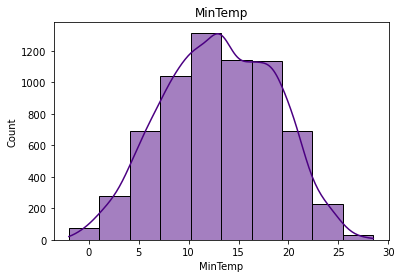

In [84]:
hist_plt(0)

In [ ]:
#normal distrinution of the dataset is being observed


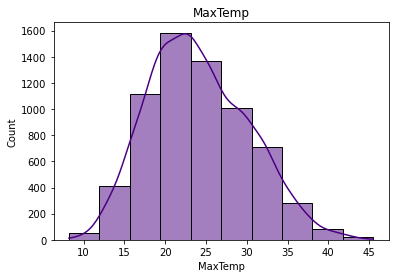

In [85]:
hist_plt(1)

In [ ]:
#normal distrinution of the dataset is being observed


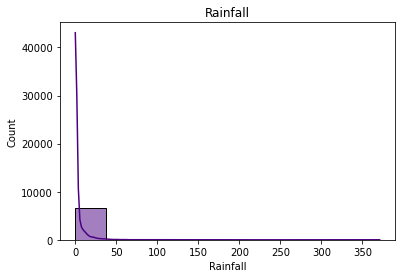

In [86]:
hist_plt(2)

In [ ]:
#The data looks Right skewed.The building block is out of the normalised curve.

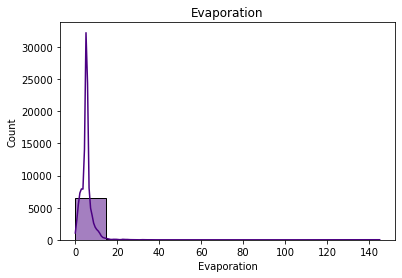

In [87]:
hist_plt(3)

In [ ]:
#The data looks Right skewed.The building block is out of the normalised curve.

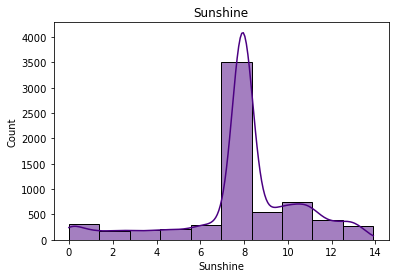

In [88]:
hist_plt(4)

In [ ]:
#The data looks  skewed.The building block is out of the normalised curve.

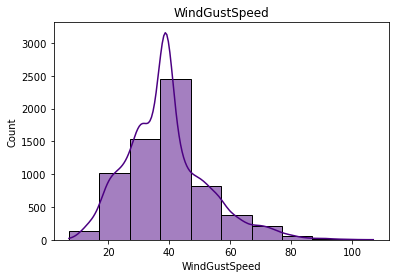

In [89]:
hist_plt(5)

In [ ]:
#normal distrinution of the dataset is being observed


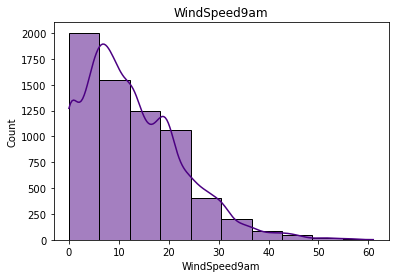

In [90]:
hist_plt(6)

In [ ]:
#The data looks Right skewed.The building block is out of the normalised curve.

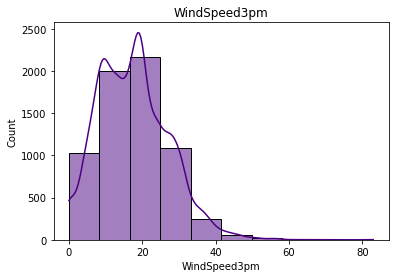

In [91]:
hist_plt(7)

In [ ]:
#The data looks Right skewed.The building block is out of the normalised curve.

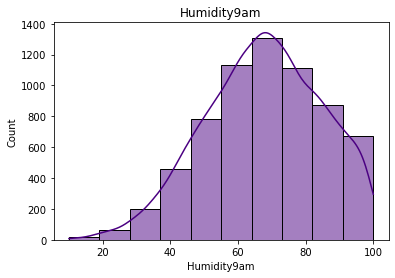

In [92]:
hist_plt(8)

In [ ]:
#normal distrinution of the dataset is being observed


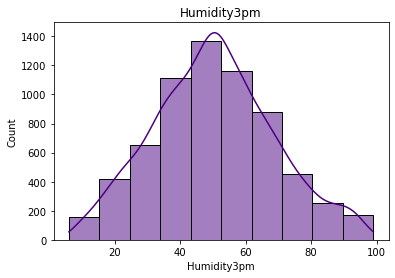

In [93]:
hist_plt(9)

In [ ]:
#normal distrinution of the dataset is being observed


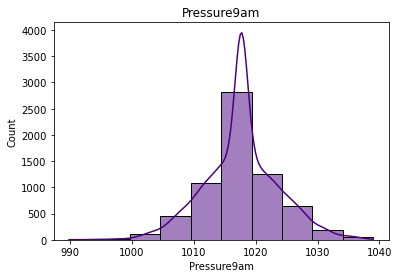

In [94]:
hist_plt(10)

In [ ]:
#normal distrinution of the dataset is being observed


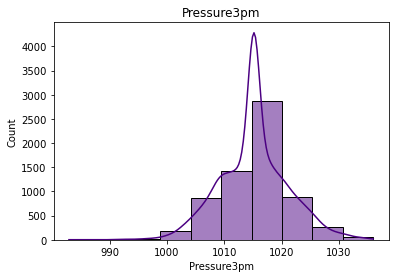

In [95]:
hist_plt(11)

In [ ]:
#normal distrinution of the dataset is being observed


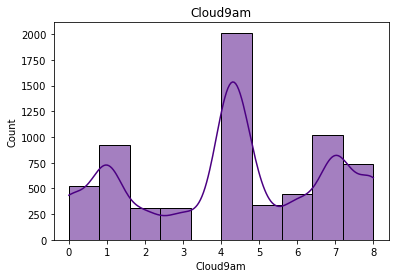

In [96]:
hist_plt(12)

In [ ]:
#normal distrinution of the dataset is being observed


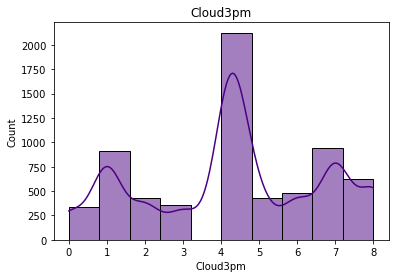

In [97]:
hist_plt(13)

In [ ]:
#normal distrinution of the dataset is being observed


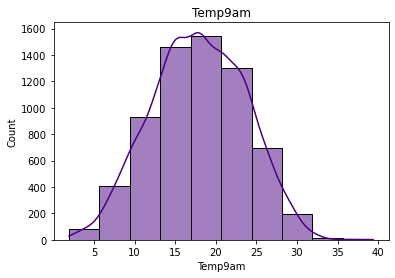

In [98]:
hist_plt(14)

In [ ]:
#normal distrinution of the dataset is being observed


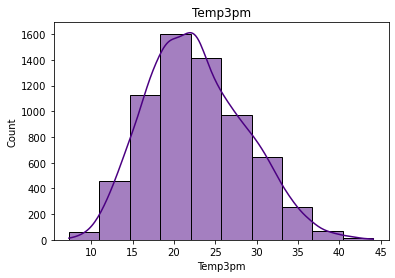

In [99]:
hist_plt(15)

In [ ]:
#normal distrinution of the dataset is being observed


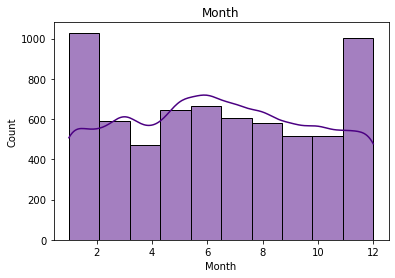

In [100]:
hist_plt(16)

In [ ]:
#normal distrinution of the dataset is being observed


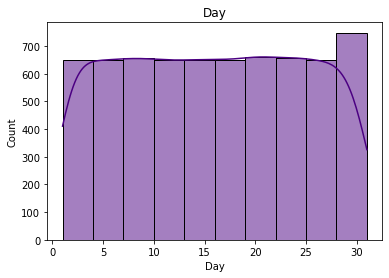

In [101]:
hist_plt(17)

In [ ]:
#normal distrinution of the dataset is being observed


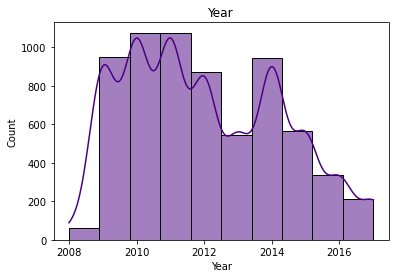

In [102]:
hist_plt(18)

In [ ]:
#normal distrinution of the dataset is being observed


In [103]:
#Distribution plot for all numerical columns
def count_plt(a):
    plt.figure(figsize = (12, 4))
    plt.title(cat_col[a])
    sns.countplot(cat_col[a],data=df)
    plt.xticks(rotation=90)
    plt.show()
    

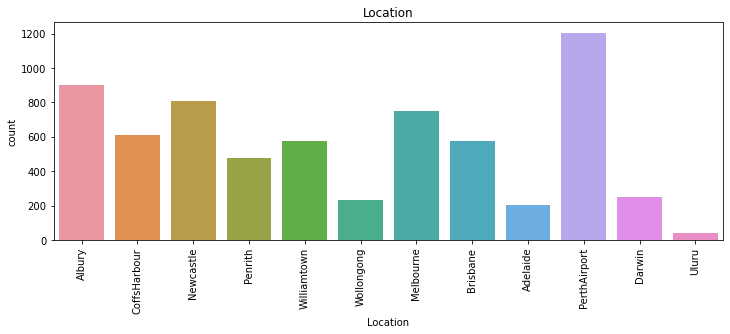

In [104]:
count_plt(0)

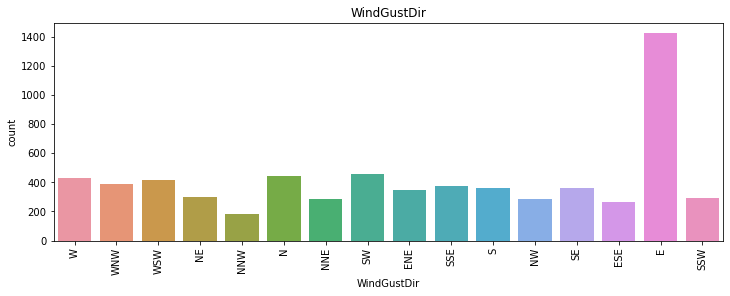

In [105]:
count_plt(1)

In [ ]:
 

In the Location column we can see 

    the   PerthAirport has 1204 count in the column
    the   Albury has 898 count in the column
    the   Newcastle has 808 count in the column
    the   Melbourne has 751 count in the column
    the   CoffsHarbour has 610 count in the column
    the   Williamtown has 577 count in the column
  
    the   Brisbane has 574 count in the column
    the   Penrith has 479 count in the column
    the   Darwin has 250 count in the column
    
    the   Wollongong has 1204 count in the column
    the   Adelaide has 898 count in the column
    the   Uluru has 808 count in the column

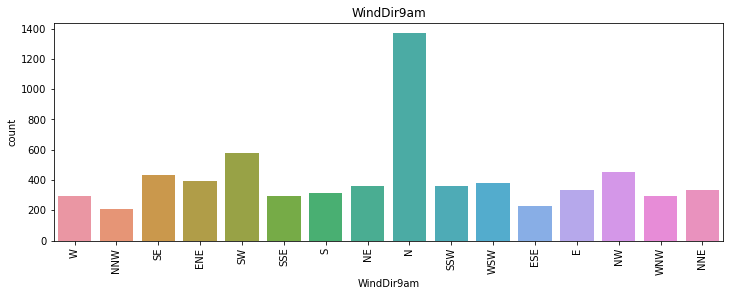

In [106]:
count_plt(2)

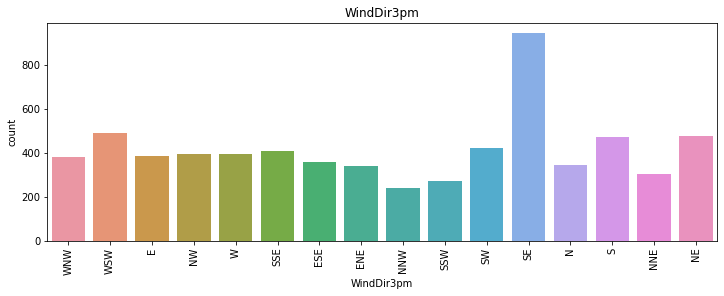

In [107]:
count_plt(3)

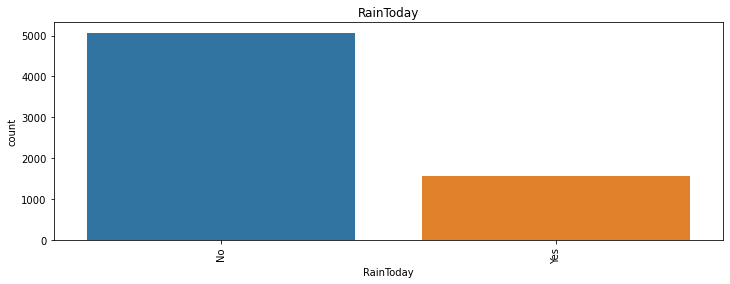

In [108]:
count_plt(4)

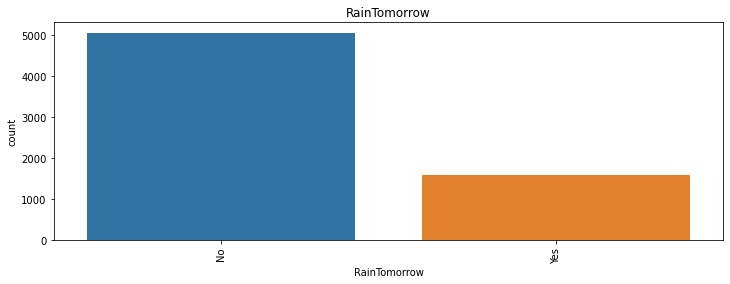

In [109]:
count_plt(5)

In [ ]:
In the RainTomorrow column we can see 

    the   No variable  has 5052 count in the column
    the   Yes variable has 1572 count in the column

We can see imbalance in the dataset in the target column

# Bivariate Analysis

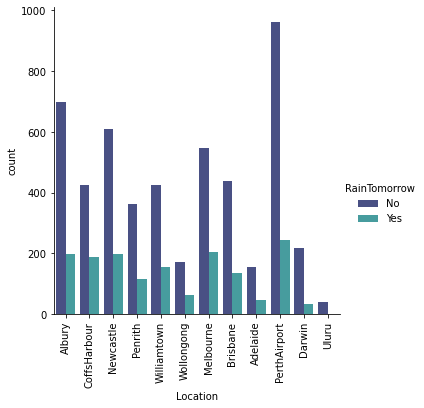

In [110]:
#Factor plot for Location
sns.factorplot('Location',kind='count',data=df,hue='RainTomorrow',palette="mako");
plt.xticks(rotation=90);

In [ ]:
#the Rain tomorrrow with No reported is high in PerthAirport and least in Uluru in the datset
#the Rain tomorrrow with yes reported is high in PerthAirport and least in Darwin

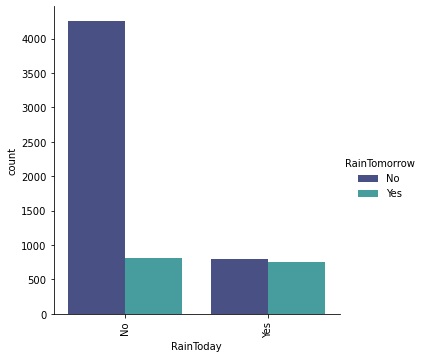

In [111]:
#Factor plot for Location
sns.factorplot('RainToday',kind='count',data=df,hue='RainTomorrow',palette="mako");
plt.xticks(rotation=90);

In [ ]:
#the Rain tomorrrow with No reported is high in No and least in yes in the datset
#the Rain tomorrrow with yes reported is high in No and least in Yes

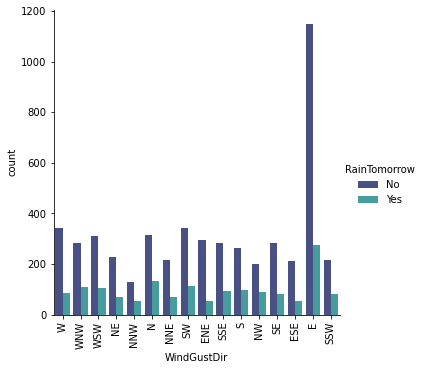

In [112]:
#Factor plot for WindGustDir
sns.factorplot('WindGustDir',kind='count',data=df,hue='RainTomorrow',palette="mako");
plt.xticks(rotation=90);

In [ ]:
#the Rain tomorrrow with No reported is high in E direction and least in NNW in the datset
#the Rain tomorrrow with yes reported is high in E and least in NNW

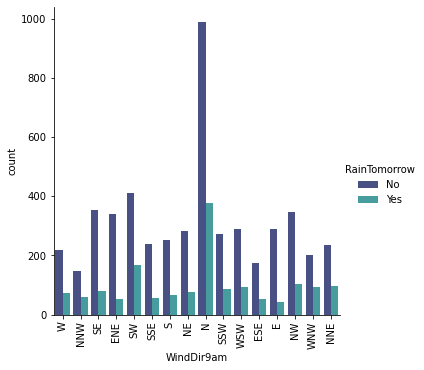

In [113]:
#Factor plot for WindDir9am
sns.factorplot('WindDir9am',kind='count',data=df,hue='RainTomorrow',palette="mako");
plt.xticks(rotation=90);

In [ ]:
#the Rain tomorrrow with No reported is high in N direction and least in NNW in the datset
#the Rain tomorrrow with yes reported is high in N and least in E

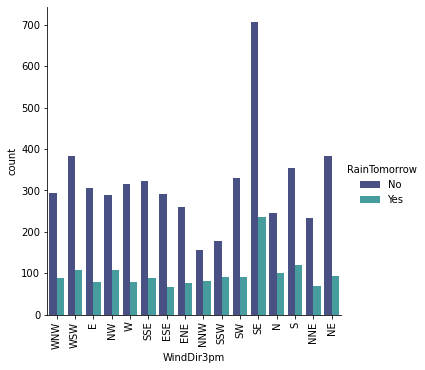

In [14]:
#Factor plot for WindGustDir
sns.factorplot('WindDir3pm',kind='count',data=df,hue='RainTomorrow',palette="mako");
plt.xticks(rotation=90);

In [ ]:
#the Rain tomorrrow with No reported is high in SE direction and least in NNW in the datset
#the Rain tomorrrow with yes reported is high in SE and least in ESE

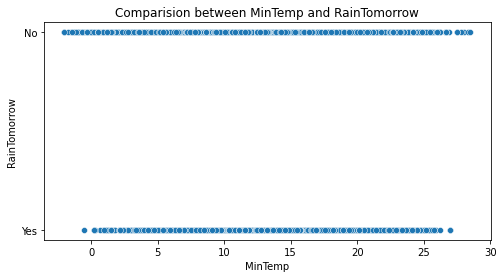

In [114]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between MinTemp and RainTomorrow')
sns.scatterplot(df['MinTemp'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of min temp is normally distributed in the range 0 to 27 ,in thedataset and rest are scattered 

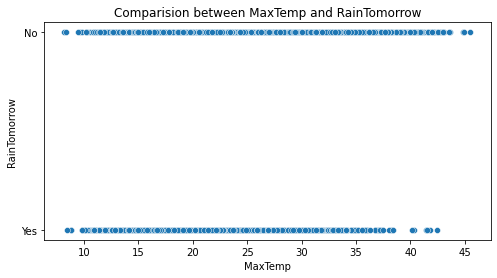

In [115]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between MaxTemp and RainTomorrow')
sns.scatterplot(df['MaxTemp'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of maxtemp is normally distributed in the range 10 to 39 ,in thedataset and rest are scattered 

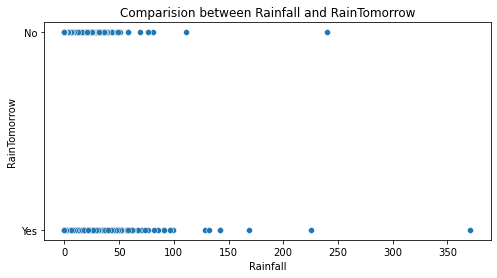

In [116]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Rainfall and RainTomorrow')
sns.scatterplot(df['Rainfall'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of Rainfall is normally distributed in the range 0 to 50 ,in the dataset and rest are scattered 

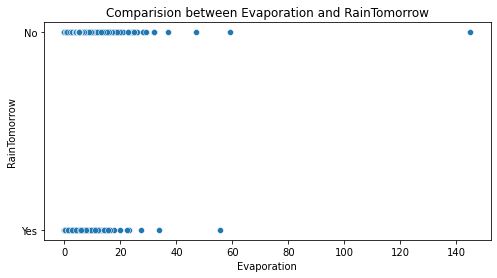

In [117]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Evaporation and RainTomorrow')
sns.scatterplot(df['Evaporation'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of Evaporation is normally distributed in the range 0 to 24 ,in the dataset and rest are scattered 

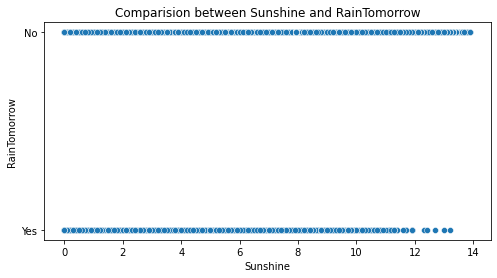

In [118]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Sunshine and RainTomorrow')
sns.scatterplot(df['Sunshine'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of Sunshine is normally distributed in the range 0 to 12 ,in the dataset and rest are scattered 

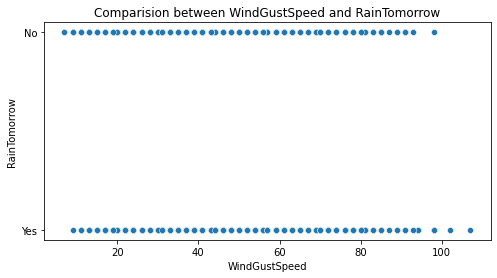

In [119]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between WindGustSpeed and RainTomorrow')
sns.scatterplot(df['WindGustSpeed'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of WindGustSpeed is normally distributed in the range 10 to 95 ,in the dataset and rest are scattered 

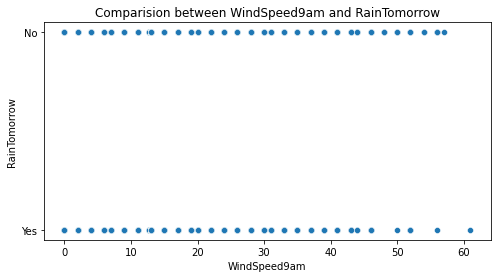

In [120]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between WindSpeed9am and RainTomorrow')
sns.scatterplot(df['WindSpeed9am'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of WindSpeed9am is scattered in the entire range dataset 

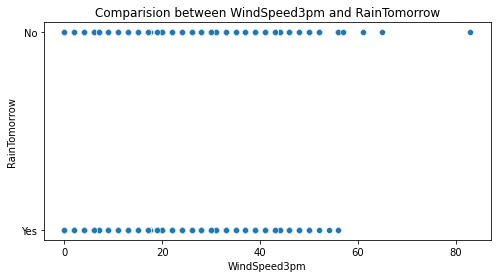

In [121]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between WindSpeed3pm and RainTomorrow')
sns.scatterplot(df['WindSpeed3pm'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of WindSpeed3pm is scattered in the entire range dataset 

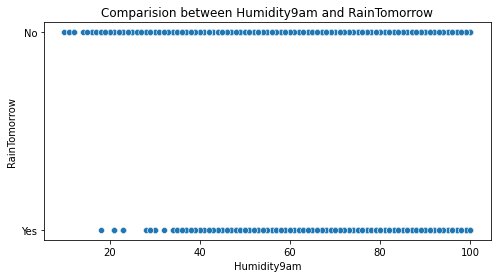

In [122]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Humidity9am and RainTomorrow')
sns.scatterplot(df['Humidity9am'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of Humidity9am is normally distributed in the range 30 to 100 ,in the dataset and rest are scattered 

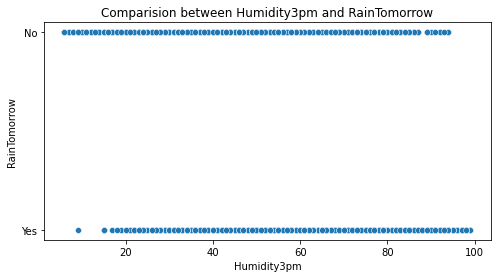

In [123]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Humidity3pm and RainTomorrow')
sns.scatterplot(df['Humidity3pm'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of Humidity3pm is normally distributed in the range 15 to 100 ,in the dataset and rest are scattered 

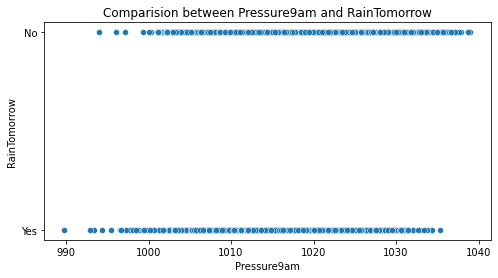

In [124]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Pressure9am and RainTomorrow')
sns.scatterplot(df['Pressure9am'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of Pressure9am is normally distributed in the range 998 to 1035 ,in the dataset and rest are scattered 

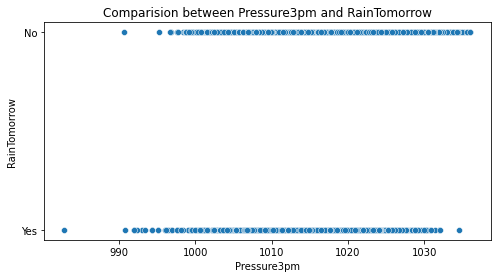

In [125]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Pressure3pm and RainTomorrow')
sns.scatterplot(df['Pressure3pm'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of Pressure3pm is normally distributed in the range 997 to 1034 ,in the dataset and rest are scattered 

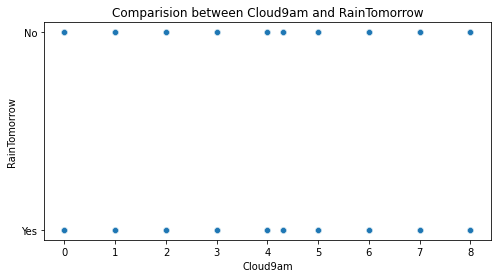

In [126]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Cloud9am and RainTomorrow')
sns.scatterplot(df['Cloud9am'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of Cloud9am is scattered in the entire range dataset 

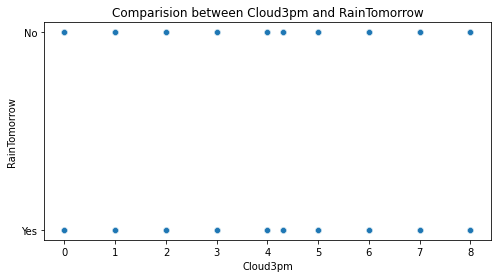

In [127]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Cloud3pm and RainTomorrow')
sns.scatterplot(df['Cloud3pm'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of Cloud3pm is scattered in the entire range dataset 

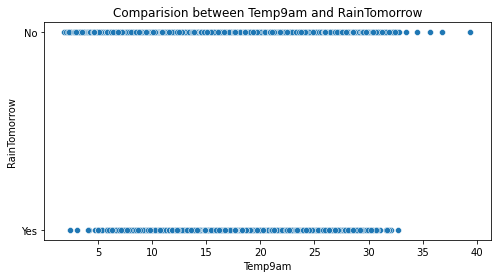

In [128]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Temp9am and RainTomorrow')
sns.scatterplot(df['Temp9am'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of Temp9am is normally distributed in the range 5 to 33 ,in the dataset and rest are scattered 

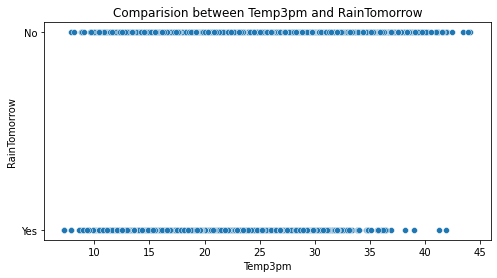

In [129]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Temp3pm and RainTomorrow')
sns.scatterplot(df['Temp3pm'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of Temp3pm is normally distributed in the range 8 to 37 ,in the dataset and rest are scattered 

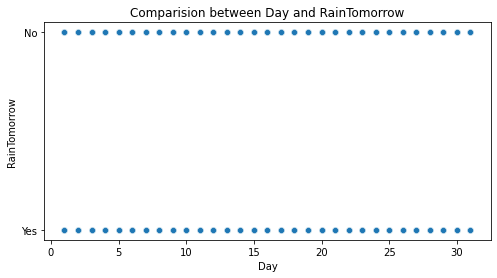

In [130]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Day and RainTomorrow')
sns.scatterplot(df['Day'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of Day is scattered in the entire range dataset 

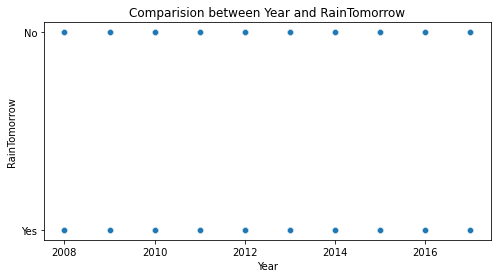

In [131]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Year and RainTomorrow')
sns.scatterplot(df['Year'],df['RainTomorrow']);

In [ ]:
#we are able to see the value of Year is scattered in the entire range dataset 

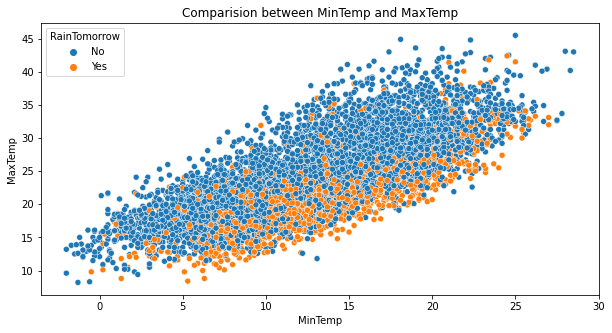

In [132]:
plt.figure(figsize=[10,5])
plt.title('Comparision between MinTemp and MaxTemp')
sns.scatterplot(df['MinTemp'],df['MaxTemp'],hue=df['RainTomorrow']);

In [ ]:
#We can see a linear relation between the MinTemp and  MaxTemp in the entire datasetand maximum data is in the range of 0 to 25 

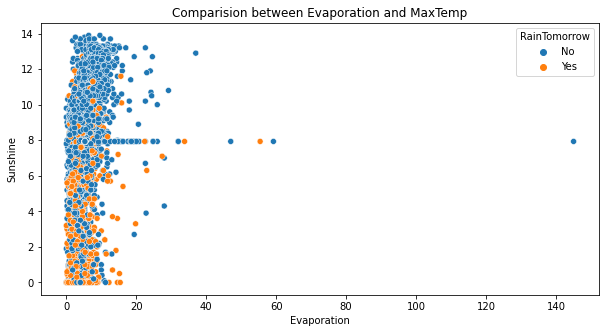

In [133]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Evaporation and MaxTemp')
sns.scatterplot(df['Evaporation'],df['Sunshine'],hue=df['RainTomorrow']);

In [ ]:
#we can see an large increase in  the range of 0 to 14 in Evaporation for Sunshine 

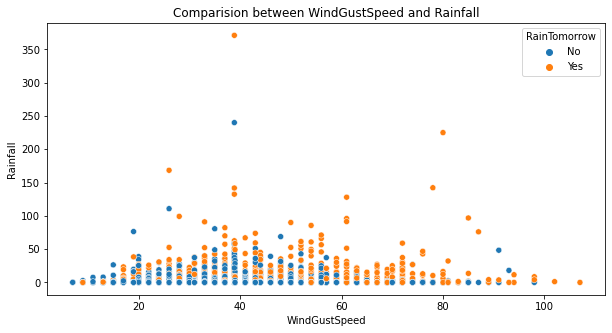

In [134]:
plt.figure(figsize=[10,5])
plt.title('Comparision between WindGustSpeed and Rainfall')
sns.scatterplot(df['WindGustSpeed'],df['Rainfall'],hue=df['RainTomorrow']);

In [ ]:
#We can see data scattered in the entire range and increase in rainfall in the range of 30 t0 60

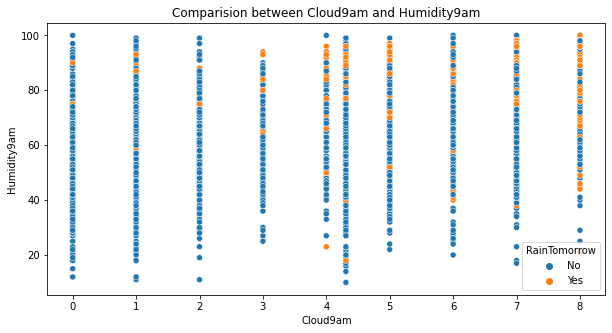

In [135]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Cloud9am and Humidity9am')
sns.scatterplot(df['Cloud9am'],df['Humidity9am'],hue=df['RainTomorrow']);

In [ ]:
#We can see data scattered in the intervals of time range and large increase in Humidity9am in these intervals along the Cloud9am axis

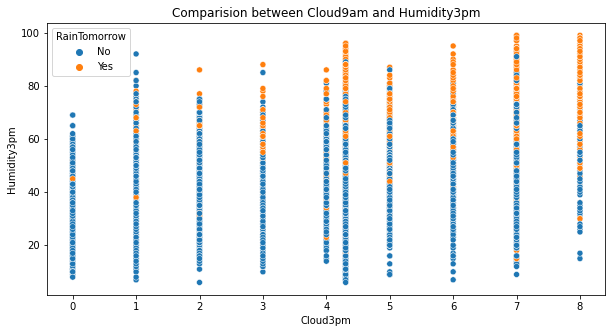

In [136]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Cloud9am and Humidity3pm')
sns.scatterplot(df['Cloud3pm'],df['Humidity3pm'],hue=df['RainTomorrow']);

In [ ]:
#We can see data scattered in the intervals of time range and large increase in Humidity3pm in these intervals along the Cloud3pm axis

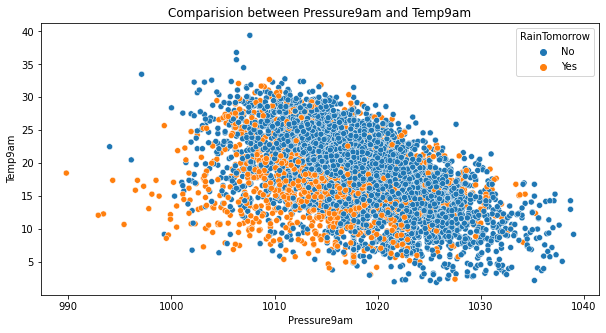

In [137]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Pressure9am and Temp9am')
sns.scatterplot(df['Pressure9am'],df['Temp9am'],hue=df['RainTomorrow']);

In [ ]:
#We can see large data set on the Pressure9am range of 1005 to 1035 and and Temp9am is getting increased in the range of 1005 to 1015 and then it is getting decreasing

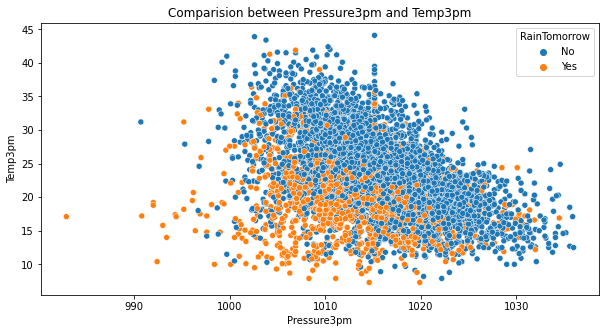

In [138]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Pressure3pm and Temp3pm')
sns.scatterplot(df['Pressure3pm'],df['Temp3pm'],hue=df['RainTomorrow']);

In [ ]:
#We can see large data set on the Pressure3pm range of 1005 to 1035 and and Temp3pm is getting increased in the range of 1005 to 1015 and then it is getting drastically decreasing

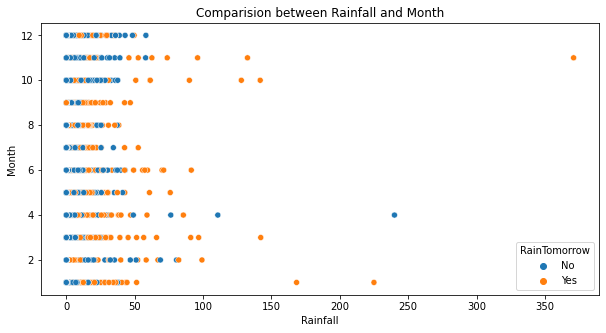

In [139]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Rainfall and Month')
sns.scatterplot(df['Rainfall'],df['Month'],hue=df['RainTomorrow']);

In [ ]:
#we can see an increase in the Rainfall along each months

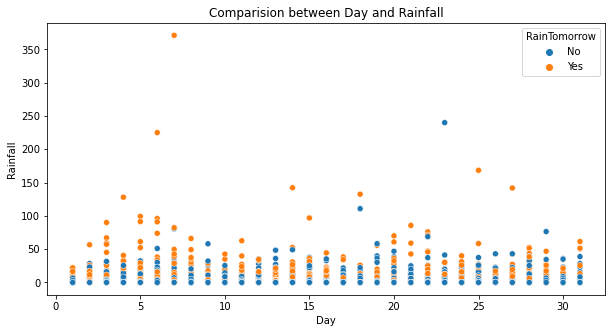

In [140]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Day and Rainfall')
sns.scatterplot(df['Day'],df['Rainfall'],hue=df['RainTomorrow']);

In [ ]:
#we can see an increase in the Rainfall along each Days

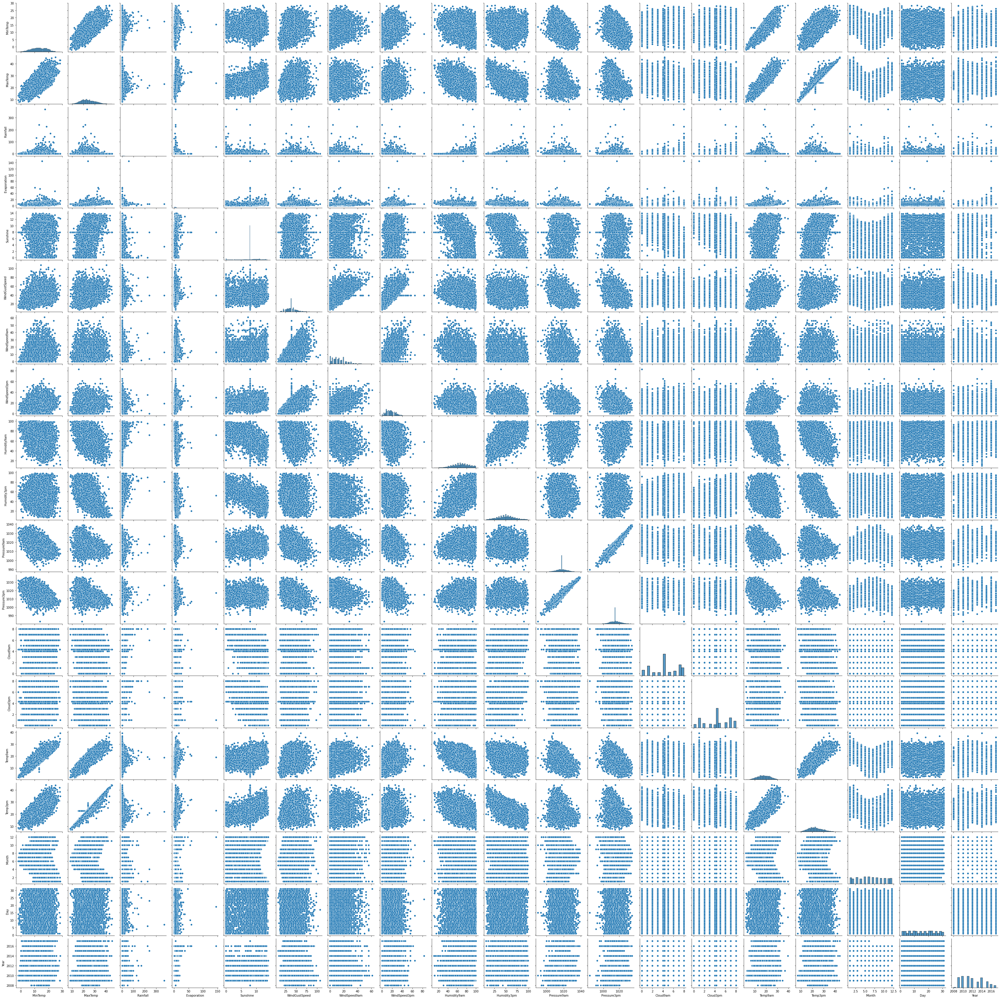

In [141]:
#pair ploting for df
sns.pairplot(df)

we can observe the linear relationship for fewe columns in the dataset

In [142]:
#creating list of categorical columsn for processing
cat_col

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [17]:
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()
df[cat_col]= df[cat_col].apply(LE.fit_transform)

In [144]:
df.head(75)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day,Year
0,1,13.4,22.9,0.600000,5.314745,7.932534,13,44.000000,13,14,20.000000,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.304692,16.9,21.8,0,0,12,1,2008
1,1,7.4,25.1,0.000000,5.314745,7.932534,14,44.000000,6,15,4.000000,22.0,44.0,25.0,1010.6,1007.8,4.308583,4.304692,17.2,24.3,0,0,12,2,2008
2,1,12.9,25.7,0.000000,5.314745,7.932534,15,46.000000,13,15,19.000000,26.0,38.0,30.0,1007.6,1008.7,4.308583,2.000000,21.0,23.2,0,0,12,3,2008
3,1,9.2,28.0,0.000000,5.314745,7.932534,4,24.000000,9,0,11.000000,9.0,45.0,16.0,1017.6,1012.8,4.308583,4.304692,18.1,26.5,0,0,12,4,2008
4,1,17.5,32.3,1.000000,5.314745,7.932534,13,41.000000,1,7,7.000000,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0,12,5,2008
5,1,14.6,29.7,0.200000,5.314745,7.932534,14,56.000000,13,13,19.000000,24.0,55.0,23.0,1009.2,1005.4,4.308583,4.304692,20.6,28.9,0,0,12,6,2008
6,1,14.3,25.0,0.000000,5.314745,7.932534,13,50.000000,12,13,20.000000,24.0,49.0,19.0,1009.6,1008.2,1.000000,4.304692,18.1,24.6,0,0,12,7,2008
7,1,7.7,26.7,0.000000,5.314745,7.932534,13,35.000000,10,13,6.000000,17.0,48.0,19.0,1013.4,1010.1,4.308583,4.304692,16.3,25.5,0,0,12,8,2008
8,1,9.7,31.9,0.000000,5.314745,7.932534,6,80.000000,9,7,7.000000,28.0,42.0,9.0,1008.9,1003.6,4.308583,4.304692,18.3,30.2,0,1,12,9,2008
9,1,13.1,30.1,1.400000,5.314745,7.932534,13,28.000000,8,10,15.000000,11.0,58.0,27.0,1007.0,1005.7,4.308583,4.304692,20.1,28.2,1,0,12,10,2008


In [145]:
df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Month            0
Day              0
Year             0
dtype: int64

# Detecting Outliers

In [146]:
len(con_col)

19

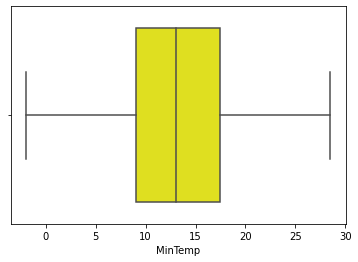

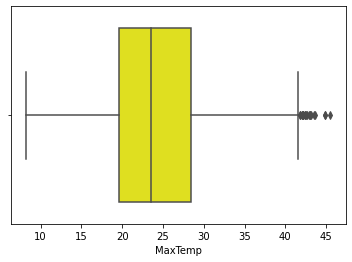

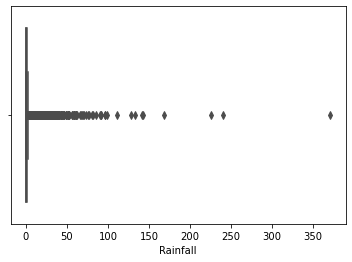

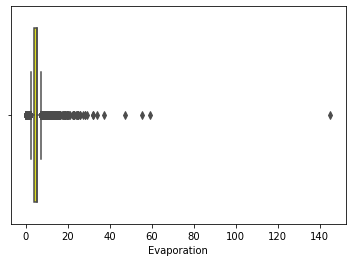

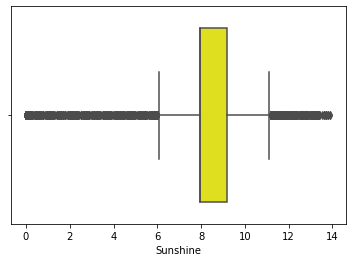

...

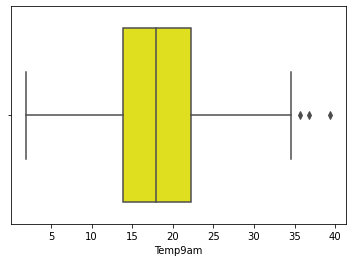

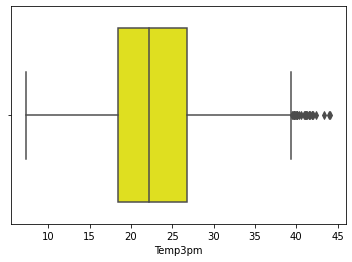

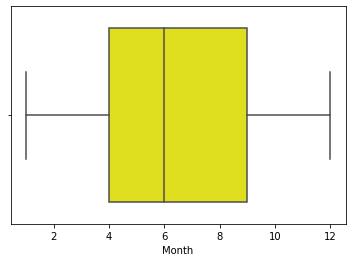

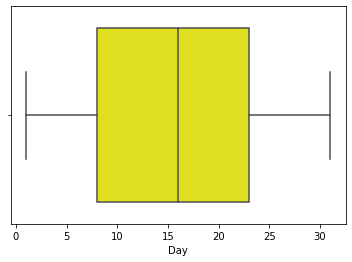

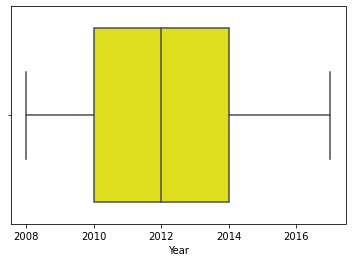

In [147]:
def bxplt(a):
    plt.figure()
    sns.boxplot(df[con_col[a]],data=df,color='yellow')
for i in range(0,19):
    bxplt(i)

In [ ]:
#Outliers present in columns
#We are able to observe outliers in the below columns
'MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am',
      'Humidity3pm','Pressure9am', 'Pressure3pm','Temp9am','Temp3pm'

In [18]:
#creating datatset with outlier columns for outlier removal 
feat=df[['MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am',
      'Humidity3pm','Pressure9am', 'Pressure3pm','Temp9am','Temp3pm']]

In [19]:
#zscore
z=np.abs(zscore(feat))
threshold=3


In [20]:
#printing the outliers points in the dataset
threshold=3
print(np.where(z>3))

(array([   8,   12,   12,   43,   43,   51,   51,   59,   59,   60,   60,
         61,   61,   61,   66,   67,   67,  122,  266,  270,  294,  379,
        379,  403,  404,  405,  429,  455,  458,  458,  555,  559,  560,
        560,  561,  594,  594,  595,  674,  674,  690,  704,  739,  739,
        761,  786,  787,  788,  793,  925,  939,  969,  970,  970,  970,
        998,  999, 1001, 1128, 1138, 1139, 1141, 1179, 1193, 1227, 1231,
       1254, 1255, 1347, 1401, 1402, 1469, 1470, 1471, 1503, 1525, 1577,
       1634, 1651, 1655, 1663, 1670, 1764, 1802, 1856, 1881, 1886, 1928,
       1999, 2011, 2026, 2056, 2090, 2098, 2164, 2177, 2195, 2195, 2206,
       2207, 2241, 2405, 2463, 2475, 2501, 2501, 2515, 2567, 2650, 2651,
       2708, 2798, 2806, 2815, 2815, 2821, 2825, 2829, 2835, 2843, 2849,
       2856, 2857, 2863, 2864, 2866, 2866, 2867, 2871, 2875, 2877, 2885,
       2891, 2899, 2905, 2913, 2919, 2927, 2933, 2938, 2952, 2966, 2988,
       3006, 3012, 3012, 3016, 3019, 3020, 3020, 3

In [21]:
#saving the data without outlier points 
df_new=df[(z<3).all(axis=1)]
df_new.shape[0]

6282

In [22]:
#chcking data loss
data_loss=((df.shape[0]-df_new.shape[0])/df.shape[0])*100
print(data_loss)

5.163043478260869


In [ ]:
data.shape

In [154]:
Q1=feat.quantile(.25)
Q3=feat.quantile(.75)

IQR=Q3-Q1


In [155]:
df_new_1=df[~(( feat<(Q1-1.5*IQR ))|(feat>(Q1+1.5*IQR))).any(axis=1)]

In [156]:
df_new_1.shape

(1576, 25)

In [157]:
((df.shape[0])-(df_new_1.shape[0]))/(df.shape[0])

0.7620772946859904

In [ ]:
#We can observe high Dataloss in the IQR method

In [23]:
#storing the outliers removed data in the dataset using Zscore
df=df_new

In [24]:
df.shape

(6282, 25)

In [ ]:
#There are 6282 rows and 25 columns in the dataset Now

# Skewness Removal

In [161]:
#distribution plot

def dtp(a):
    plt.figure()
    sns.distplot(df[con_col[a]],color='brown',bins=5)
    

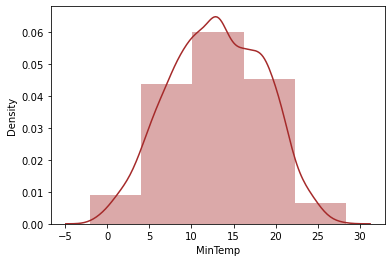

In [162]:
dtp(0)

In [ ]:
#normal distrinution of the dataset is being observed


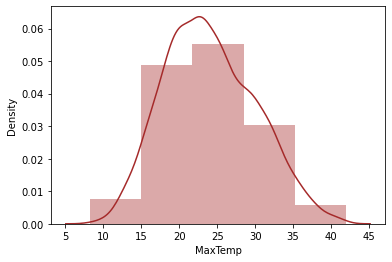

In [163]:
dtp(1)

In [ ]:
#normal distrinution of the dataset is being observed


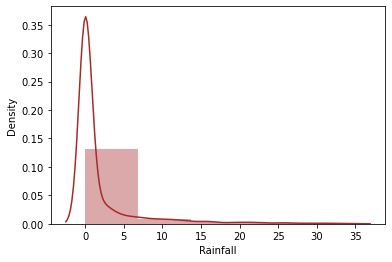

In [164]:
dtp(2)

In [ ]:
#The data looks Right skewed.The building block is out of the normalised curve.

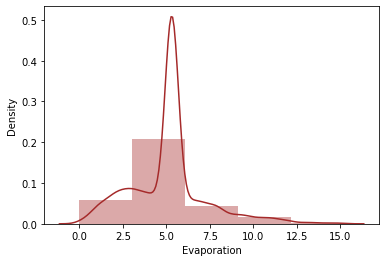

In [165]:
dtp(3)

In [ ]:
#The data looks Right skewed.The building block is out of the normalised curve.

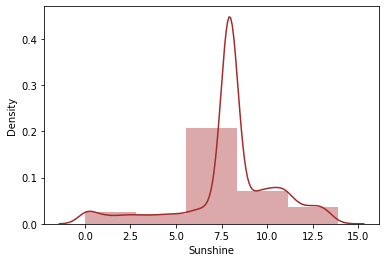

In [166]:
dtp(4)

In [ ]:
#The data looks  skewed.The building block is out of the normalised curve.

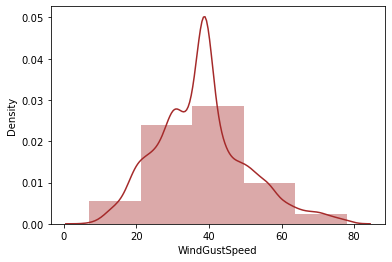

In [167]:
dtp(5)

In [ ]:
#The data looks skewed.The building block is out of the normalised curve.

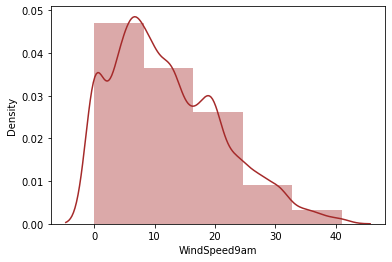

In [168]:
dtp(6)

In [ ]:
#The data looks Right skewed.The building block is out of the normalised curve.

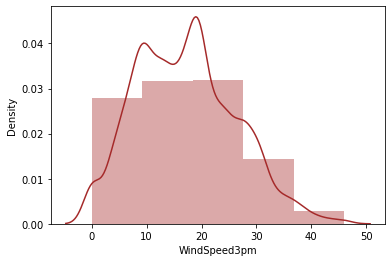

In [169]:
dtp(7)

In [ ]:
#normal distrinution of the dataset is being observed


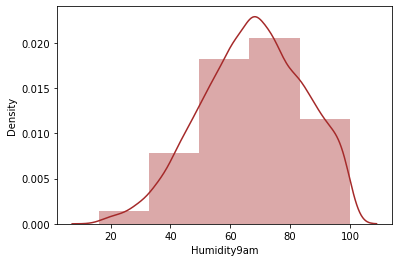

In [170]:
dtp(8)

In [ ]:
#normal distrinution of the dataset is being observed


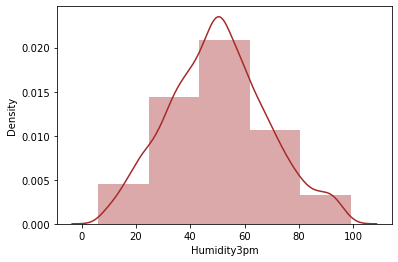

In [171]:
dtp(9)

In [ ]:
#normal distrinution of the dataset is being observed


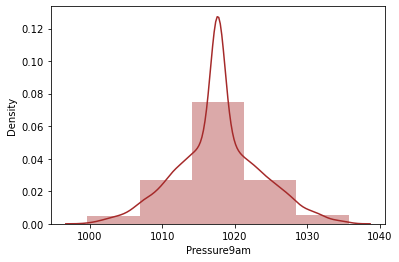

In [172]:
dtp(10)

In [ ]:
#normal distrinution of the dataset is being observed


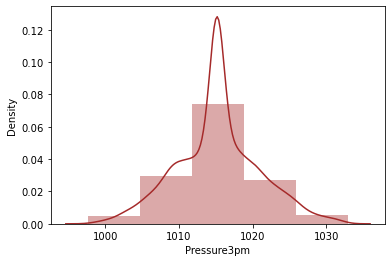

In [173]:
dtp(11)

In [ ]:
#normal distrinution of the dataset is being observed


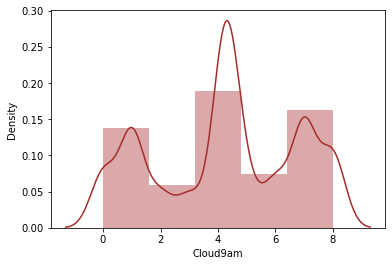

In [174]:
dtp(12)

In [ ]:
#normal distrinution of the dataset is being observed


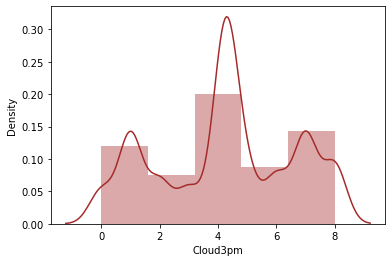

In [175]:
dtp(13)

In [ ]:
#normal distrinution of the dataset is being observed


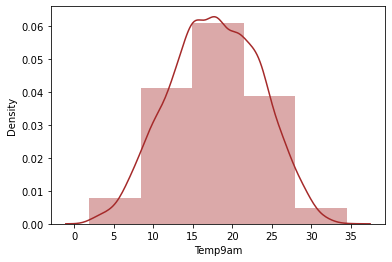

In [176]:
dtp(14)

In [ ]:
#normal distrinution of the dataset is being observed


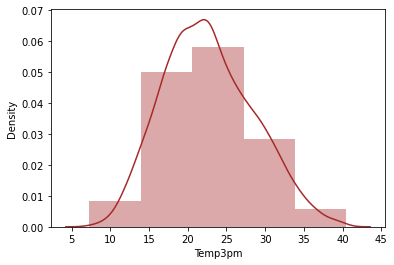

In [177]:
dtp(15)

In [ ]:
#normal distrinution of the dataset is being observed


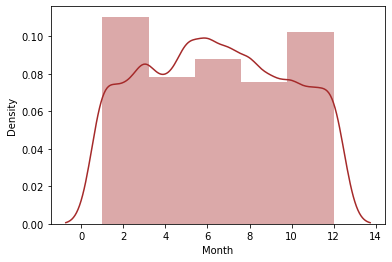

In [178]:
dtp(16)

In [ ]:
#normal distrinution of the dataset is being observed


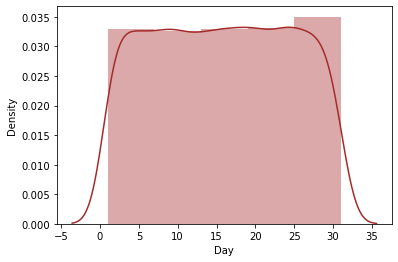

In [179]:
dtp(17)

In [ ]:
#normal distrinution of the dataset is being observed


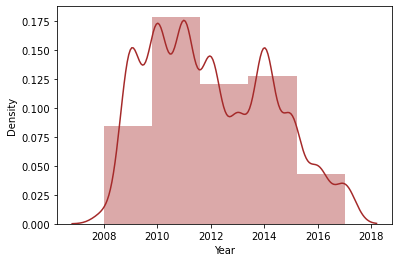

In [180]:
dtp(18)

In [ ]:
#normal distrinution of the dataset is being observed


In [25]:
#initialising X and y
X=df.drop(['RainTomorrow'],axis=1)
y=df.RainTomorrow

In [26]:
X.skew()

Location         0.006464
MinTemp         -0.068114
MaxTemp          0.270989
Rainfall         3.523618
Evaporation      0.716271
Sunshine        -0.912152
WindGustDir      0.103184
WindGustSpeed    0.489639
WindDir9am       0.211026
WindDir3pm      -0.123621
WindSpeed9am     0.676621
WindSpeed3pm     0.348182
Humidity9am     -0.232790
Humidity3pm      0.159446
Pressure9am      0.060326
Pressure3pm      0.090821
Cloud9am        -0.184962
Cloud3pm        -0.137006
Temp9am         -0.070637
Temp3pm          0.292510
RainToday        1.319006
Month            0.035538
Day              0.001409
Year             0.355845
dtype: float64

In [28]:
features=['Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am']


In [29]:
from sklearn.preprocessing import PowerTransformer
X[features]=PowerTransformer(method='yeo-johnson').fit_transform(X[features])

In [30]:
X[features].skew()

Rainfall         1.008184
Evaporation      0.071225
Sunshine        -0.054091
WindGustSpeed    0.004824
WindSpeed9am    -0.133636
dtype: float64

In [360]:
#we need to drop the Rain fall column because of high skewness from the dataset

In [361]:
X.drop('Rainfall',axis=1,inplace=True)

In [362]:
X.skew()

Location         0.006464
MinTemp         -0.068114
MaxTemp          0.270989
Evaporation      0.071225
Sunshine        -0.054091
WindGustDir      0.103184
WindGustSpeed    0.004824
WindDir9am       0.211026
WindDir3pm      -0.123621
WindSpeed9am    -0.133636
WindSpeed3pm    -0.078303
Humidity9am     -0.232790
Humidity3pm      0.159446
Pressure9am      0.060326
Pressure3pm      0.090821
Cloud9am        -0.184962
Cloud3pm        -0.137006
Temp9am         -0.070637
Temp3pm          0.292510
RainToday        1.319006
Month            0.035538
Day              0.001409
Year             0.355845
dtype: float64

# Scaling the data

In [363]:
scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=X.columns)

# checking multicollinearity

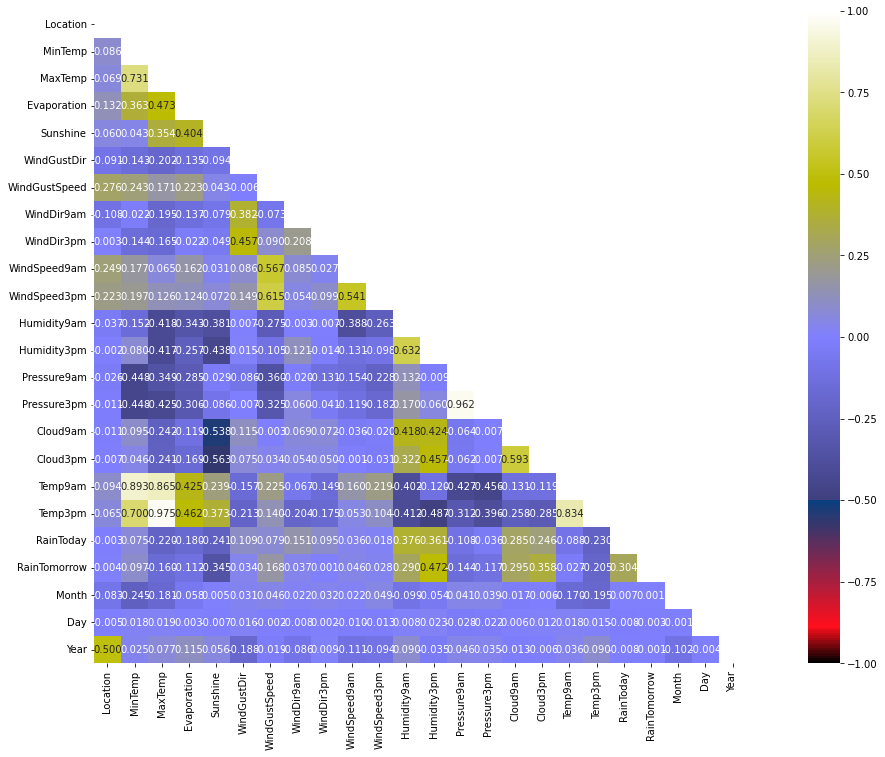

In [364]:
df_cor=df.drop('Rainfall',axis=1).corr()
upper_triangle = np.triu(df_cor)
plt.figure(figsize=(22,12))
sns.heatmap(df_cor, vmin=-1, vmax=1, annot=True, square=True, fmt='0.3f', 
            annot_kws={'size':10}, cmap="gist_stern", mask=upper_triangle)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

In [365]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X_scaled,i) for i in range(X.shape[1])]
vif['features']=X.columns
vif.sort_values('vif')

,vif,features
21,1.004971,Day
20,1.157192,Month
7,1.354593,WindDir9am
19,1.390048,RainToday
8,1.430845,WindDir3pm
22,1.578216,Year
5,1.610124,WindGustDir
0,1.649662,Location
3,1.651641,Evaporation
16,1.937389,Cloud3pm


In [366]:
#we can see multicollinearity in the columns lets drop the columns iteratively

In [367]:
#dropping the multicollinear feature
X.drop('Temp3pm',axis=1,inplace=True)

In [369]:
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=X.columns)

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X_scaled,i) for i in range(X.shape[1])]
vif['features']=X.columns
vif.sort_values('vif')

,vif,features
20,1.004709,Day
19,1.141413,Month
7,1.353053,WindDir9am
18,1.389808,RainToday
8,1.430515,WindDir3pm
21,1.578216,Year
5,1.604883,WindGustDir
0,1.649579,Location
3,1.650410,Evaporation
16,1.926325,Cloud3pm


In [370]:
#dropping the multicollinear feature
X.drop('Pressure9am',axis=1,inplace=True)

In [371]:
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=X.columns)

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X_scaled,i) for i in range(X.shape[1])]
vif['features']=X.columns
vif.sort_values('vif')

,vif,features
19,1.003585,Day
18,1.140517,Month
7,1.327209,WindDir9am
8,1.358338,WindDir3pm
17,1.374634,RainToday
13,1.447825,Pressure3pm
20,1.576460,Year
5,1.590622,WindGustDir
3,1.630936,Evaporation
0,1.646490,Location


In [372]:
#dropping the multicollinear feature
X.drop('Temp9am',axis=1,inplace=True)

In [373]:
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=X.columns)

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X_scaled,i) for i in range(X.shape[1])]
vif['features']=X.columns
vif.sort_values('vif')

,vif,features
18,1.003469,Day
17,1.126261,Month
7,1.325920,WindDir9am
8,1.358338,WindDir3pm
16,1.372810,RainToday
13,1.444840,Pressure3pm
19,1.569421,Year
5,1.589255,WindGustDir
3,1.610941,Evaporation
0,1.643667,Location


There is no multicollinearity found in features now.. we can proceed with data as the values are less than 10.

In [374]:
len(X.columns)

20

# PCA

In [375]:
from sklearn.decomposition import PCA
pca=PCA()
pca.fit_transform(X_scaled)

array([[ 2.08340092e-01,  1.54309068e+00, -2.61171720e+00, ...,
         3.02316042e-01,  1.09238168e+00, -5.09953684e-01],
       [ 8.22037417e-01, -4.79365585e-02, -2.67032295e+00, ...,
        -3.37555357e-01, -3.32212082e-01,  2.19413217e-01],
       [ 1.57329135e+00,  1.00405921e+00, -3.54674716e+00, ...,
        -1.60334341e-01, -2.60931084e-01,  8.70361128e-02],
       ...,
       [ 3.19125118e-01, -1.81984114e+00,  1.78204434e-01, ...,
        -3.11742152e-01,  3.43084365e-01,  6.40743760e-01],
       [ 6.85983852e-01, -9.31206440e-01, -1.20559717e-01, ...,
         1.38094870e-05,  2.37687858e-01,  6.97290625e-01],
       [ 1.13447485e+00, -1.61104867e+00,  3.89124776e-02, ...,
         1.10469023e-01, -1.37358326e-02,  4.70820559e-01]])

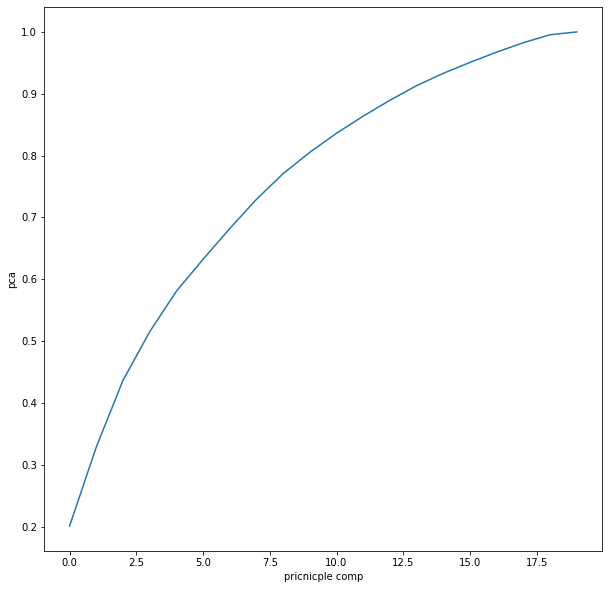

In [376]:
plt.figure(figsize=(10,10))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("pricnicple comp")
plt.ylabel("pca")
plt.show()

In [377]:
pca=PCA(n_components=18)
new_pcomp=pca.fit_transform(X_scaled)
princi_comp=pd.DataFrame(new_pcomp,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10',
                                            'PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18'])

In [378]:
#updating the features
X=princi_comp

In [379]:
y.shape[0]

6282

# Oversampling with SMOTE

In [380]:
y.value_counts()

0    4852
1    1430
Name: RainTomorrow, dtype: int64

In [381]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
X,y = SM.fit_resample(X,y)

In [382]:
# Checking the updated value counts 
y.value_counts()

0    4852
1    4852
Name: RainTomorrow, dtype: int64

In [ ]:
#the target variable  is balanced Now

# Model Building

In [383]:
#X,y already initialized
X.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18
0,0.208340,1.543091,-2.611717,-2.120020,0.306560,-0.959890,2.288739,-0.104886,0.366900,0.116659,-0.312454,-0.170180,0.285123,0.889070,-1.293439,0.248460,-0.488695,0.302316
1,0.822037,-0.047937,-2.670323,-1.896188,0.383692,-1.910673,2.455114,0.011233,-0.850382,0.588944,-0.172208,-0.058648,0.178384,0.359733,0.163447,0.597111,0.240603,-0.337555
2,1.573291,1.004059,-3.546747,-2.117172,0.132036,-0.643204,1.854580,0.015885,0.336448,0.583856,-0.358032,-0.092926,-0.239819,0.162860,-0.779193,-0.095223,0.291869,-0.160334
3,0.901820,-1.808036,-0.762721,-1.987758,2.162933,-0.251303,1.598469,-0.512857,1.650653,0.720802,0.576116,0.262442,1.168291,0.076004,-0.339678,0.463820,-0.046776,-0.458830
4,0.204796,1.141097,0.252288,-2.614582,1.356384,-1.844086,2.081959,-0.160559,-0.595200,0.373183,-0.363420,-1.476917,0.943920,0.155049,0.597937,0.403621,-0.312355,0.530684


In [384]:
#finding best random_state

maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.30,random_state=i)
    lg=LogisticRegression()
    lg.fit(x_train,y_train)
    predlg=lg.predict(x_test)
    acc=accuracy_score(y_test,predlg)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on random_state ",maxRS)

Best accuracy is  0.7956730769230769  on random_state  83


In [385]:
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.30,random_state=maxRS)

In [386]:
# different algorithm going to use
lg=LogisticRegression()
knn=KNeighborsClassifier()
svc=SVC()
dtc=DecisionTreeClassifier()
rf=RandomForestClassifier()
ada=AdaBoostClassifier()
gd=GradientBoostingClassifier()
xgb=XGBClassifier()
etc=ExtraTreesClassifier()

In [387]:
#code for Training and Prediction 

def evaluate(x):
    model=x
    print(model)
    #training the model
    model.fit(x_train,y_train)
    pred_train=model.predict(x_train)
    #model prediction
    pred=model.predict(x_test)
    
    print("train accuracy score is {:.2f}%".format(accuracy_score(y_train,pred_train)*100))
    print("test accuracy score is {:.2f}%".format(accuracy_score(y_test,pred)*100))
    
    print("\n")
    print("Confusion Matrix : \n",confusion_matrix(y_test,pred))
    print("\n")
    print("Classification Report  : \n",classification_report(y_test,pred))

In [388]:
#calling LogisticRegressionClassifier
evaluate(lg)

LogisticRegression()
train accuracy score is 77.28%
test accuracy score is 79.57%


Confusion Matrix : 
 [[1192  284]
 [ 311 1125]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.79      0.81      0.80      1476
           1       0.80      0.78      0.79      1436

    accuracy                           0.80      2912
   macro avg       0.80      0.80      0.80      2912
weighted avg       0.80      0.80      0.80      2912



In [389]:
#calling KNeighborsClassifier
evaluate(knn)


KNeighborsClassifier()
train accuracy score is 88.66%
test accuracy score is 84.31%


Confusion Matrix : 
 [[1086  390]
 [  67 1369]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.94      0.74      0.83      1476
           1       0.78      0.95      0.86      1436

    accuracy                           0.84      2912
   macro avg       0.86      0.84      0.84      2912
weighted avg       0.86      0.84      0.84      2912



In [390]:
#calling SVC Classifier
evaluate(svc)

SVC()
train accuracy score is 87.32%
test accuracy score is 86.13%


Confusion Matrix : 
 [[1241  235]
 [ 169 1267]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.88      0.84      0.86      1476
           1       0.84      0.88      0.86      1436

    accuracy                           0.86      2912
   macro avg       0.86      0.86      0.86      2912
weighted avg       0.86      0.86      0.86      2912



In [398]:
#calling DecisionTreeClassifier
evaluate(dtc)

DecisionTreeClassifier()
train accuracy score is 100.00%
test accuracy score is 79.50%


Confusion Matrix : 
 [[1149  327]
 [ 270 1166]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.81      0.78      0.79      1476
           1       0.78      0.81      0.80      1436

    accuracy                           0.79      2912
   macro avg       0.80      0.80      0.79      2912
weighted avg       0.80      0.79      0.79      2912



In [392]:
#calling RandomForestClassifier
evaluate(rf)

RandomForestClassifier()
train accuracy score is 100.00%
test accuracy score is 89.63%


Confusion Matrix : 
 [[1297  179]
 [ 123 1313]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.91      0.88      0.90      1476
           1       0.88      0.91      0.90      1436

    accuracy                           0.90      2912
   macro avg       0.90      0.90      0.90      2912
weighted avg       0.90      0.90      0.90      2912



In [399]:
#calling AdaBoostClassifier
evaluate(ada)

AdaBoostClassifier()
train accuracy score is 79.23%
test accuracy score is 78.95%


Confusion Matrix : 
 [[1154  322]
 [ 291 1145]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.80      0.78      0.79      1476
           1       0.78      0.80      0.79      1436

    accuracy                           0.79      2912
   macro avg       0.79      0.79      0.79      2912
weighted avg       0.79      0.79      0.79      2912



In [394]:
#calling GradientBoostingClassifier
evaluate(gd)

GradientBoostingClassifier()
train accuracy score is 84.53%
test accuracy score is 81.90%


Confusion Matrix : 
 [[1188  288]
 [ 239 1197]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.83      0.80      0.82      1476
           1       0.81      0.83      0.82      1436

    accuracy                           0.82      2912
   macro avg       0.82      0.82      0.82      2912
weighted avg       0.82      0.82      0.82      2912



In [395]:
#calling XGBClassifier
evaluate(xgb)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=None,
              gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None,
              reg_alpha=None, reg_lambda=None, ...)
train accuracy score is 99.94%
test accuracy score is 88.84%


Confusion Matrix : 
 [[1275  201]
 [ 124 1312]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.91      0.86      0.89      1476
          

In [396]:
#calling Extra tree Classifier
evaluate(etc)

ExtraTreesClassifier()
train accuracy score is 100.00%
test accuracy score is 91.66%


Confusion Matrix : 
 [[1329  147]
 [  96 1340]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.93      0.90      0.92      1476
           1       0.90      0.93      0.92      1436

    accuracy                           0.92      2912
   macro avg       0.92      0.92      0.92      2912
weighted avg       0.92      0.92      0.92      2912



In [397]:
model=[lg,knn,svc,dtc,rf,ada,gd,xgb,etc]

for m in model:
    score=cross_val_score(m,X,y,cv=5)
    print(m,"Cross val score is ",score*100,"   ")
    print("mean is ",score.mean()*100,"\n\n")

LogisticRegression() Cross val score is  [72.69448738 63.7815559  65.8423493  76.0947965  82.16494845]    
mean is  72.11562750628063 


KNeighborsClassifier() Cross val score is  [64.09067491 57.70221535 68.21226172 75.83719732 80.20618557]    
mean is  69.20970697429851 


SVC() Cross val score is  [69.08809892 58.73261206 65.94538897 78.56774858 81.08247423]    
mean is  70.68326455169776 


DecisionTreeClassifier() Cross val score is  [65.12107161 64.19371458 71.09737249 78.05255023 84.22680412]    
mean is  72.53830260732856 


RandomForestClassifier() Cross val score is  [73.62184441 67.54250386 74.60072128 87.17156105 89.58762887]    
mean is  78.50485189375227 


AdaBoostClassifier() Cross val score is  [69.13961875 62.49356002 64.96651211 77.48583205 80.25773196]    
mean is  70.86865097701791 


GradientBoostingClassifier() Cross val score is  [67.69706337 60.32972694 66.87274601 78.77382792 83.45360825]    
mean is  71.42539449853142 


XGBClassifier(base_score=0.5, booster=

# DecisionTreeClassifier is the Best model with least difference in Test accuracy and Cross validation of 7.23%

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18
0,0.208340,1.543091,-2.611717,-2.120020,0.306560,-0.959890,2.288739,-0.104886,0.366900,0.116659,-0.312454,-0.170180,0.285123,0.889070,-1.293439,0.248460,-0.488695,0.302316
1,0.822037,-0.047937,-2.670323,-1.896188,0.383692,-1.910673,2.455114,0.011233,-0.850382,0.588944,-0.172208,-0.058648,0.178384,0.359733,0.163447,0.597111,0.240603,-0.337555
2,1.573291,1.004059,-3.546747,-2.117172,0.132036,-0.643204,1.854580,0.015885,0.336448,0.583856,-0.358032,-0.092926,-0.239819,0.162860,-0.779193,-0.095223,0.291869,-0.160334
3,0.901820,-1.808036,-0.762721,-1.987758,2.162933,-0.251303,1.598469,-0.512857,1.650653,0.720802,0.576116,0.262442,1.168291,0.076004,-0.339678,0.463820,-0.046776,-0.458830
4,0.204796,1.141097,0.252288,-2.614582,1.356384,-1.844086,2.081959,-0.160559,-0.595200,0.373183,-0.363420,-1.476917,0.943920,0.155049,0.597937,0.403621,-0.312355,0.530684


In [424]:
#parameters of DecisionTreeClassifier 
    
grid_params = {
    'criterion':['gini','entropy','log_loss'],
    'splitter':['best','random'],
    'max_depth':range(1,30,2),
    'min_samples_split':range(1,10,1),
    'min_samples_leaf':range(1,10,1),
    'max_features':['auto','sqrt','log2']

}

In [425]:
from sklearn.model_selection import GridSearchCV

grid_search= GridSearchCV(estimator=dtc,param_grid=grid_params,cv= 5,n_jobs=-1)

In [426]:
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': range(1, 30, 2),
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(1, 10),
                         'splitter': ['best', 'random']})

In [427]:
grid_search.best_params_

{'criterion': 'entropy',
 'max_depth': 29,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 4,
 'splitter': 'best'}

In [428]:
h_dtc=DecisionTreeClassifier(criterion='entropy',max_depth=29,max_features='auto',min_samples_leaf=1,
                           min_samples_split=4,splitter='best')


In [434]:
#calling DecisionTreeClassifier
evaluate(h_dtc)

DecisionTreeClassifier(criterion='entropy', max_depth=29, max_features='auto',
                       min_samples_split=4)
train accuracy score is 99.06%
test accuracy score is 81.08%


Confusion Matrix : 
 [[1177  299]
 [ 252 1184]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.82      0.80      0.81      1476
           1       0.80      0.82      0.81      1436

    accuracy                           0.81      2912
   macro avg       0.81      0.81      0.81      2912
weighted avg       0.81      0.81      0.81      2912



The hyper parameter tuning of support vector classifier gives actual accuracy of 79.77 % and cross val of 72.53 %. Since there is accuracy increase of more than 1% for hypertuned parameter. The hypertuned model of DecisionTreeClassifier algorithm is selected for final output.

# AUC_ROC CURVE

In [445]:
from sklearn.metrics import roc_auc_score 
from sklearn.metrics import plot_roc_curve

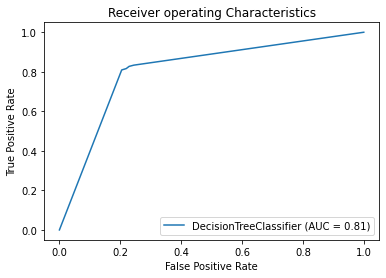

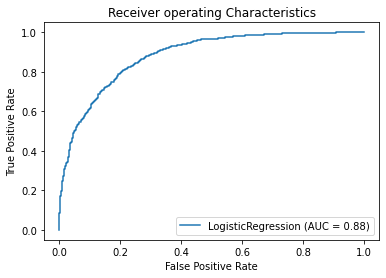

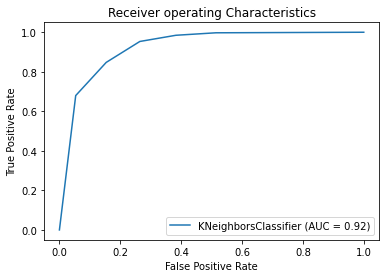

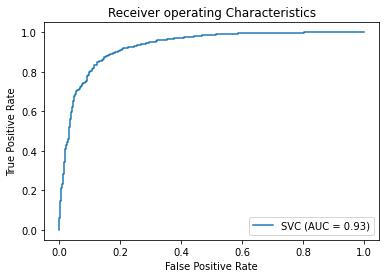

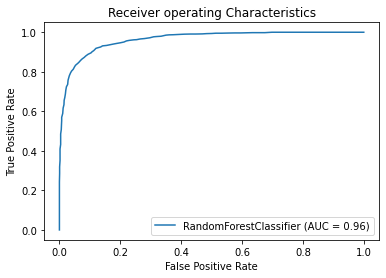

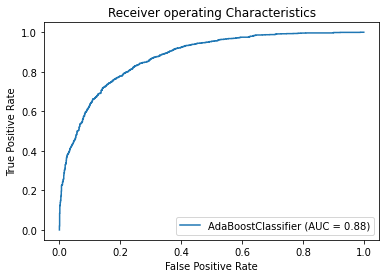

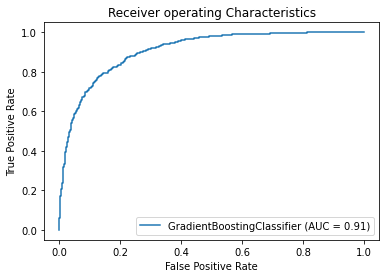

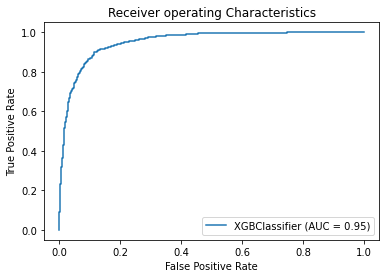

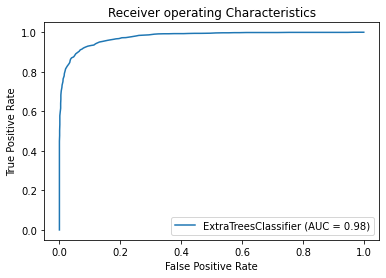

In [446]:
#lets see how well our model works on train data

model=[h_dtc,lg,knn,svc,rf,ada,gd,xgb,etc]
for m in model:
    ax=m.fit(x_train,y_train)
    plot_roc_curve(ax,x_test,y_test)
    plt.title('Receiver operating Characteristics')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
plt.show()

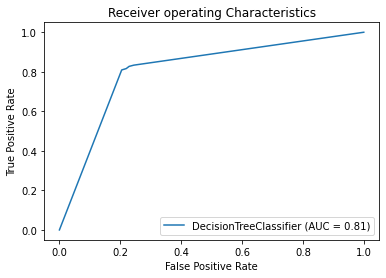

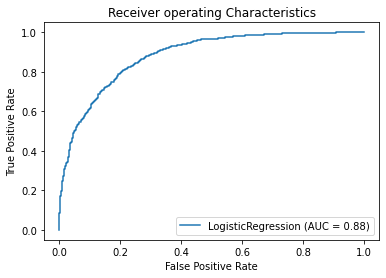

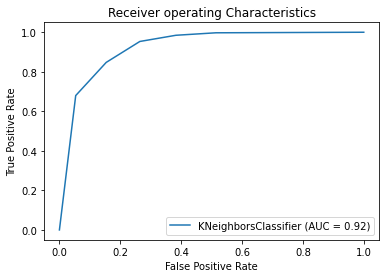

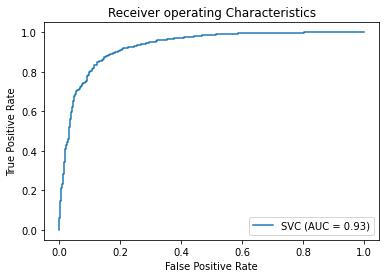

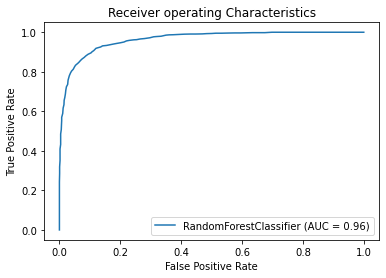

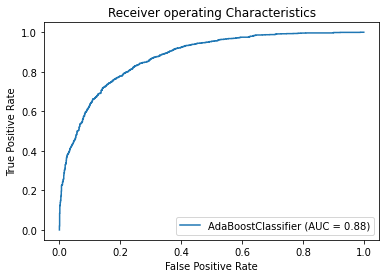

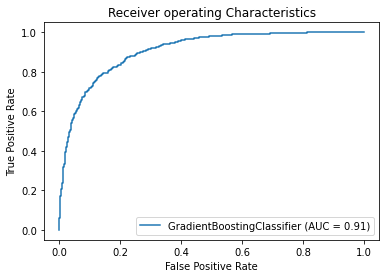

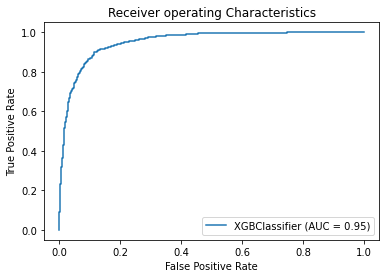

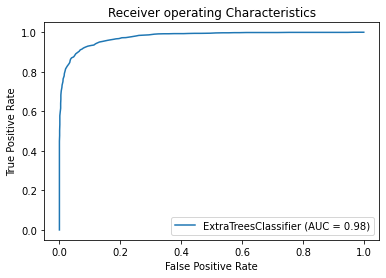

In [447]:
#lets see how well our model works on test data

model=[h_dtc,lg,knn,svc,rf,ada,gd,xgb,etc]
for m in model:
    plot_roc_curve(m,x_test,y_test)
    plt.title('Receiver operating Characteristics')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.show()

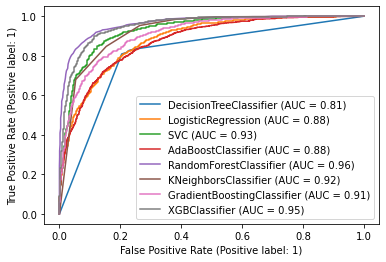

In [448]:

disp = plot_roc_curve(h_dtc,x_test,y_test)
plot_roc_curve(lg, x_test, y_test, ax=disp.ax_)     # ax_=Axes with confusion matrix
plot_roc_curve(svc, x_test, y_test, ax=disp.ax_)
plot_roc_curve(ada, x_test, y_test, ax=disp.ax_)
plot_roc_curve(rf, x_test, y_test, ax=disp.ax_)
plot_roc_curve(knn, x_test, y_test, ax=disp.ax_)
plot_roc_curve(gd, x_test, y_test, ax=disp.ax_)
plot_roc_curve(xgb, x_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':10}, loc='lower right')
plt.show()

DecisionTreeClassifier hypertuned model with true accuracy 81.08% is selected as final model for execution

In [450]:
joblib.dump(h_dtc,"weather_Forecasting.obj")

['weather_Forecasting.obj']

In [451]:
#Lets Check loading the file 

weather_Forecasting_prediction=joblib.load("weather_Forecasting.obj")

In [453]:
pred=h_dtc.predict(x_test)
Conclusion=pd.DataFrame([weather_Forecasting_prediction.predict(x_test)[:],pred[:]],index=["Predicted","Original"])

In [454]:
Conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

# Rainfall prediction model

In [48]:
#importing Dataset
data=pd.read_csv('weatherAUS.csv')

In [5]:
#shape of the dataset
data.shape

(8425, 23)

In [8]:
#we can see there are 8425 rows and 23 columns in the dataset

In [1234]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [1235]:
data.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [1236]:
#we can see many missing values in the dataset

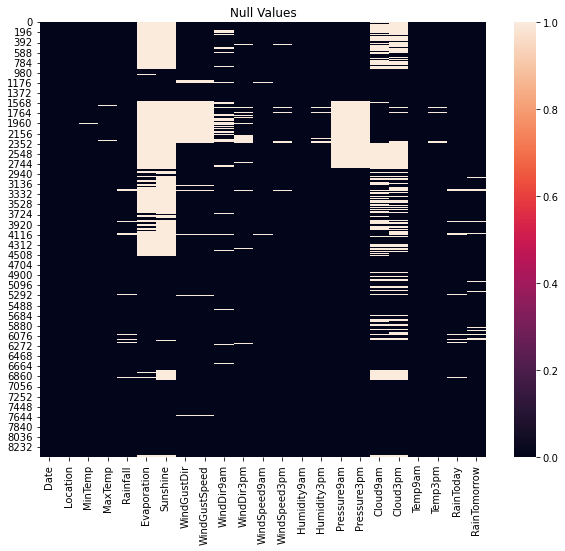

In [1237]:
# heatmap on null values
plt.figure(figsize=[10,8])
sns.heatmap(data.isnull())
plt.title("Null Values")
plt.show()

In [49]:
#duplicates removal
data.drop_duplicates(inplace=True)
data.shape

(6762, 23)

In [50]:
#changing Date to datetime format for Date
data['Date']=pd.to_datetime(data['Date'])
data["Month"]=data["Date"].dt.month
data["Day"]=data["Date"].dt.day
data["Year"]=data["Date"].dt.year


#dropping the Date column since we have the data of this column
data.drop('Date',axis=1,inplace=True)

In [51]:
#dropping the rows in  Rainfall having null values since it is the target variable and filling the values in it might influence the model so,

data.drop(data[data['Rainfall'].isnull()==True].index,inplace=True)

In [52]:
#creating list for filling missing values in categorical data
cat_imp=['WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow']

In [53]:
#defining function to fi missing values

def impu():
    for i in range(len(cat_imp)):
        data[cat_imp[i]] = data[cat_imp[i]].fillna(data[cat_imp[i]].mode()[0])
impu()

In [54]:
data[cat_imp].isnull().sum()

WindGustDir     0
WindDir9am      0
WindDir3pm      0
RainToday       0
RainTomorrow    0
dtype: int64

In [55]:
data.isnull().sum()

Location            0
MinTemp            49
MaxTemp            44
Rainfall            0
Evaporation      2848
Sunshine         3164
WindGustDir         0
WindGustSpeed     923
WindDir9am          0
WindDir3pm          0
WindSpeed9am       42
WindSpeed3pm       85
Humidity9am        37
Humidity3pm        82
Pressure9am      1291
Pressure3pm      1294
Cloud9am         1758
Cloud3pm         1802
Temp9am            34
Temp3pm            78
RainToday           0
RainTomorrow        0
Month               0
Day                 0
Year                0
dtype: int64

In [56]:
#creating list for filling missing values in Continous data
cont_imp=['MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm',
          'Humidity9am', 'Humidity3pm','Pressure9am','Pressure3pm','Humidity3pm','Cloud9am','Cloud3pm','Temp9am','Temp3pm']

In [57]:
def cont_impu():
    for i in range(len(cont_imp)):
        data[cont_imp[i]] = data[cont_imp[i]].fillna(data[cont_imp[i]].mean())
cont_impu()

In [58]:
data[cont_imp].isnull().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Humidity3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

In [16]:
#we have removed all the null values in the dataset by imputation techniques.`

In [59]:
data.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Month,Day,Year
count,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000,6624.000000
mean,13.079437,24.094848,2.780148,5.320630,7.924249,38.869321,12.726071,17.483713,67.471383,50.448945,1017.680761,1015.159325,4.324085,4.315844,17.890941,22.708081,6.432216,15.759662,2012.038647
std,5.560955,6.127989,10.591418,3.363053,2.724450,13.378652,9.816827,9.545389,17.219806,18.529500,6.012086,5.947806,2.491535,2.337840,5.728135,5.970288,3.358574,8.795574,2.297255
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,1.000000,1.000000,2008.000000
25%,9.000000,19.600000,0.000000,4.000000,7.924249,30.000000,6.000000,9.000000,56.000000,38.000000,1014.300000,1011.600000,2.000000,2.000000,13.900000,18.400000,4.000000,8.000000,2010.000000
50%,13.100000,23.500000,0.000000,5.320630,7.924249,38.869321,11.000000,17.000000,68.000000,50.000000,1017.680761,1015.159325,4.324085,4.315844,17.900000,22.200000,6.000000,16.000000,2012.000000
75%,17.400000,28.400000,0.800000,5.320630,9.200000,46.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000,9.000000,23.000000,2014.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,12.000000,31.000000,2017.000000


In [60]:
#there are no null values but able to observe few outliers and skewness in the dataset

# Bivariate Analysis

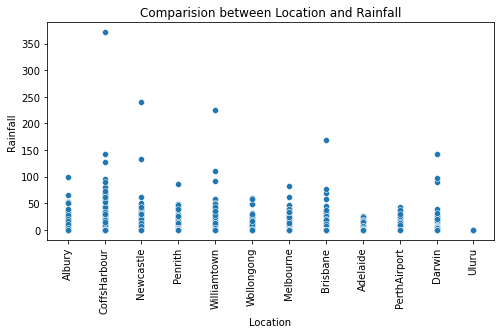

In [46]:

#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Location and Rainfall')
sns.scatterplot(data['Location'],data['Rainfall']);
plt.xticks(rotation=90);

We are able to see that the Rain fall take place uniformly in the range of 0 to 50 for all location except ulruru,In rest of the range it is scattered

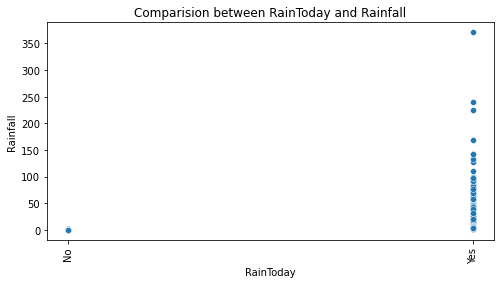

In [43]:

#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between RainToday and Rainfall')
sns.scatterplot(data['RainToday'],data['Rainfall']);
plt.xticks(rotation=90);

RainToday is categorical variables data the we can see increase in the rainfall along Raintoday being Yes least incorrect datapoint in  No

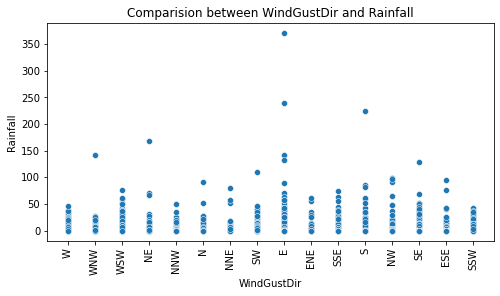

In [44]:


#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between WindGustDir and Rainfall')
sns.scatterplot(data['WindGustDir'],data['Rainfall']);
plt.xticks(rotation=90);

In [ ]:
#We can observe an increase in the rainfall and uniformly distributed in the range of 0 to 25and rest of the range in All the direction they are scattered in Each directions

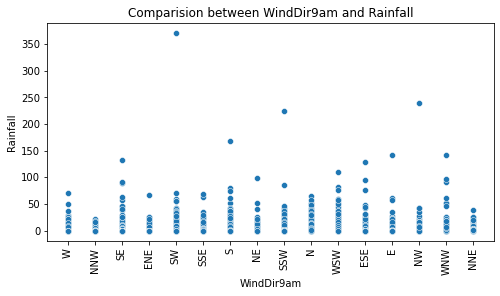

In [45]:


#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between WindDir9am and Rainfall')
sns.scatterplot(data['WindDir9am'],data['Rainfall']);
plt.xticks(rotation=90);

In [ ]:
#We can observe an increase in the rainfall and uniformly distributed in the range of 0 to 25and rest of the range in All the direction they are scattered in Each directions

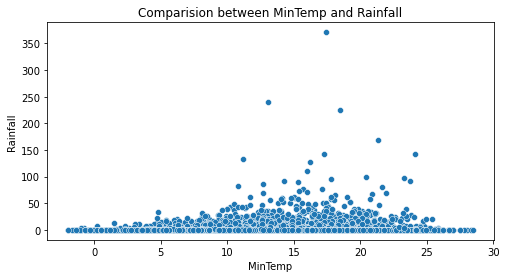

In [570]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between MinTemp and Rainfall')
sns.scatterplot(data['MinTemp'],data['Rainfall']);

In [ ]:
#se can observe small increase in the rainfall along the axis of minTemp and it is mostly increasing slightly in range of 15 to 25

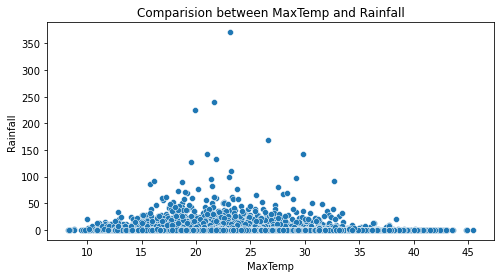

In [571]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between MaxTemp and Rainfall')
sns.scatterplot(data['MaxTemp'],data['Rainfall']);

In [ ]:
#se can observe small increase in the rainfall along the axis of minTemp and it is mostly increasing  in the range of 20 to 25

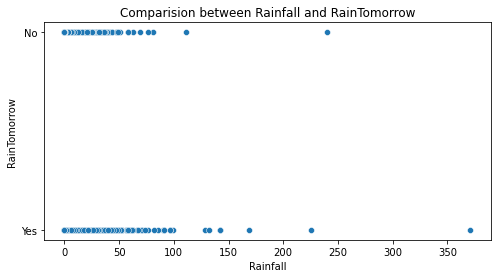

In [47]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Rainfall and RainTomorrow')
sns.scatterplot(x=data['Rainfall'],y=data['RainTomorrow']);

In [ ]:
we are able to see the value of Rainfall is normally distributed in the range 0 to 70 ,in thedataset

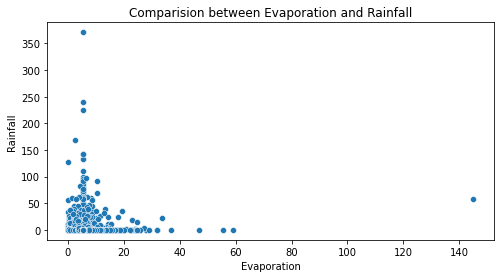

In [573]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Evaporation and Rainfall')
sns.scatterplot(data['Evaporation'],data['Rainfall']);

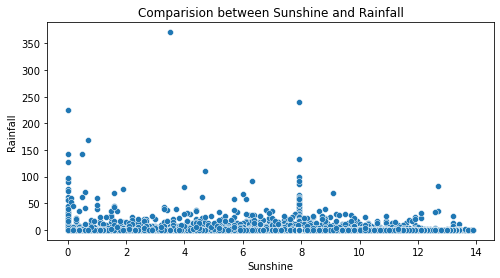

In [574]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Sunshine and Rainfall')
sns.scatterplot(data['Sunshine'],data['Rainfall']);

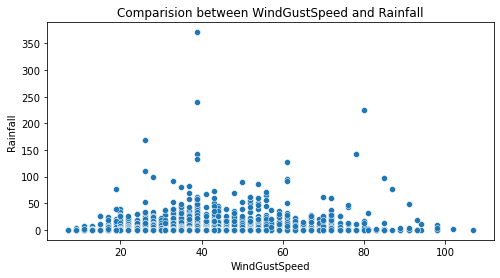

In [575]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between WindGustSpeed and Rainfall')
sns.scatterplot(data['WindGustSpeed'],data['Rainfall']);

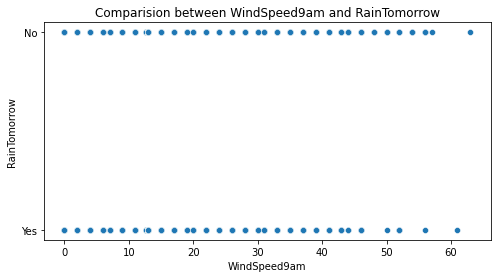

In [576]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between WindSpeed9am and RainTomorrow')
sns.scatterplot(data['WindSpeed9am'],data['RainTomorrow']);

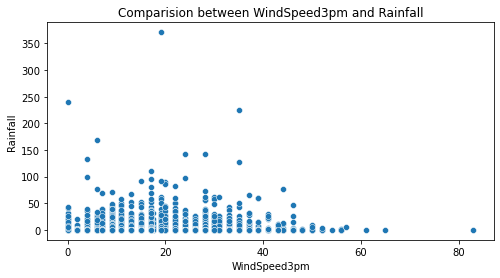

In [577]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between WindSpeed3pm and Rainfall')
sns.scatterplot(data['WindSpeed3pm'],data['Rainfall']);

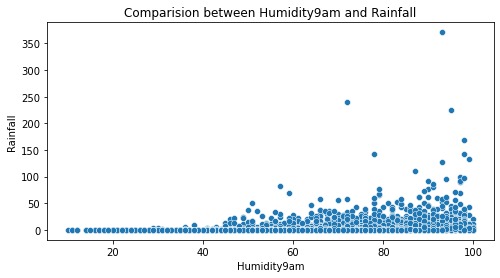

In [578]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Humidity9am and Rainfall')
sns.scatterplot(data['Humidity9am'],data['Rainfall']);

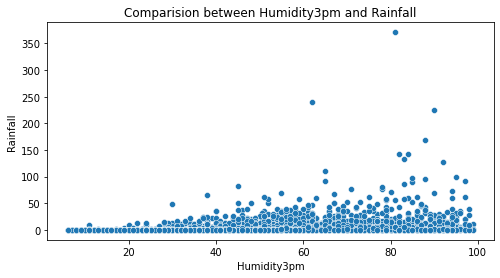

In [579]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Humidity3pm and Rainfall')
sns.scatterplot(data['Humidity3pm'],data['Rainfall']);

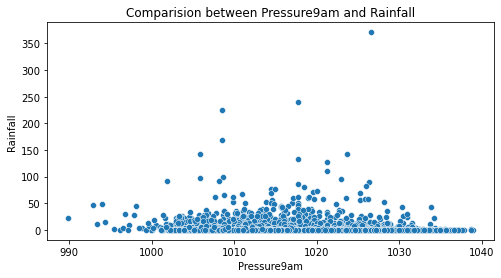

In [580]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Pressure9am and Rainfall')
sns.scatterplot(data['Pressure9am'],data['Rainfall']);

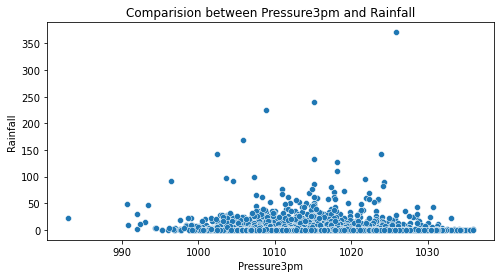

In [581]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Pressure3pm and Rainfall')
sns.scatterplot(data['Pressure3pm'],data['Rainfall']);

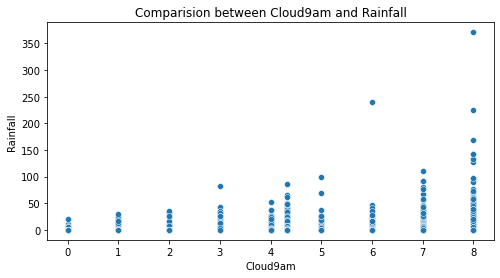

In [582]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Cloud9am and Rainfall')
sns.scatterplot(data['Cloud9am'],data['Rainfall']);

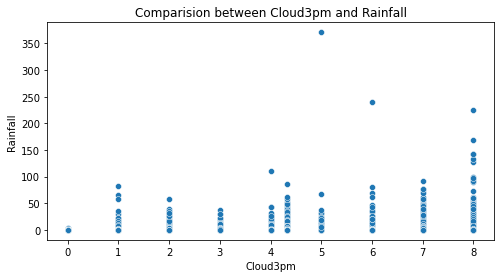

In [583]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Cloud3pm and Rainfall')
sns.scatterplot(data['Cloud3pm'],data['Rainfall']);

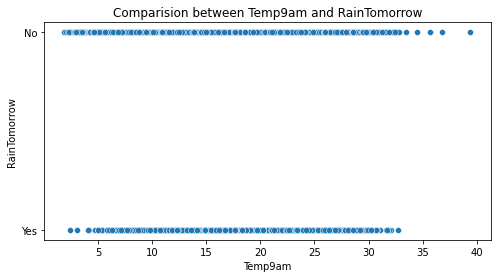

In [584]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Temp9am and RainTomorrow')
sns.scatterplot(data['Temp9am'],data['RainTomorrow']);

In [ ]:
#we are able to see the value of Temp9am is normally distributed in the range 5 to 33 ,in the dataset and rest are scattered 

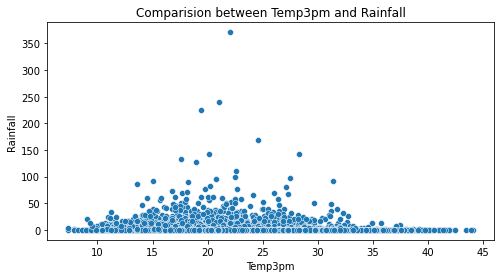

In [585]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Temp3pm and Rainfall')
sns.scatterplot(data['Temp3pm'],data['Rainfall']);

In [ ]:
#we can observe a small increase in the rain fall anong the axis of temp major increase is in the range of 17 to 33

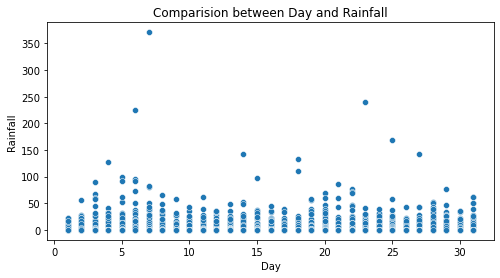

In [586]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Day and Rainfall')
sns.scatterplot(data['Day'],data['Rainfall']);

In [ ]:
#we can observe increase in rainfall in each day ,It is normally distributed in the range of 0 to 25

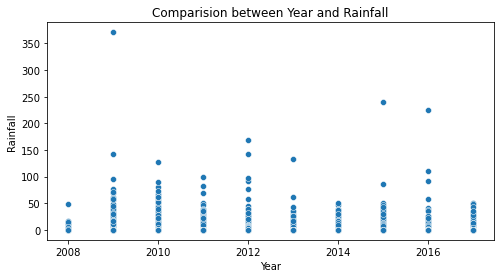

In [587]:
#Comparision between features using scatter plot
plt.figure(figsize=[8,4])
plt.title('Comparision between Year and Rainfall')
sns.scatterplot(data['Year'],data['Rainfall']);

In [ ]:
#we can observe and increase in the Rainfall along the xis of year

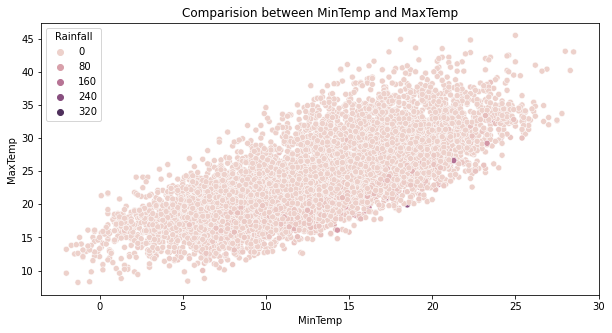

In [588]:
plt.figure(figsize=[10,5])
plt.title('Comparision between MinTemp and MaxTemp')
sns.scatterplot(data['MinTemp'],data['MaxTemp'],hue=data['Rainfall']);

In [ ]:
#We can see a linear relation between the MinTemp and  MaxTemp in the entire dataset and maximum data is in the range of 0 to 25 

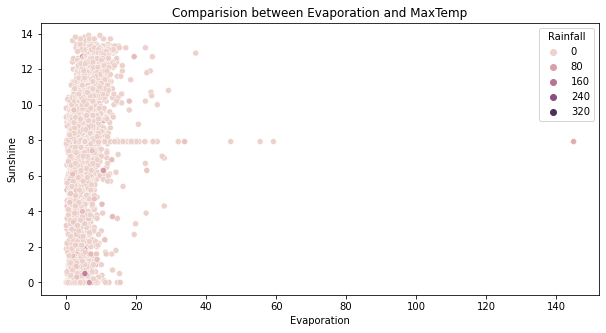

In [589]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Evaporation and MaxTemp')
sns.scatterplot(data['Evaporation'],data['Sunshine'],hue=data['Rainfall']);

In [ ]:
#we can see an large increase in the range of 0 to 14 in Evaporation for Sunshine 

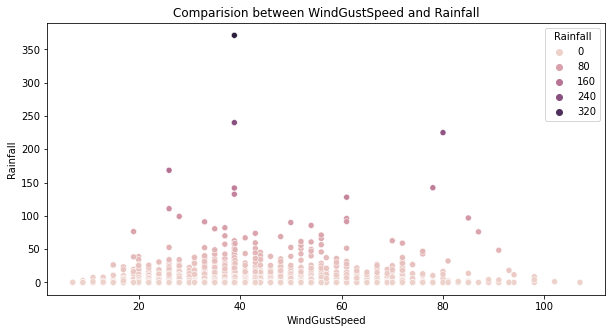

In [590]:
plt.figure(figsize=[10,5])
plt.title('Comparision between WindGustSpeed and Rainfall')
sns.scatterplot(data['WindGustSpeed'],data['Rainfall'],hue=data['Rainfall']);

In [ ]:
#We can see data scattered in the entire range and increase in rainfall in the range of 30 t0 60

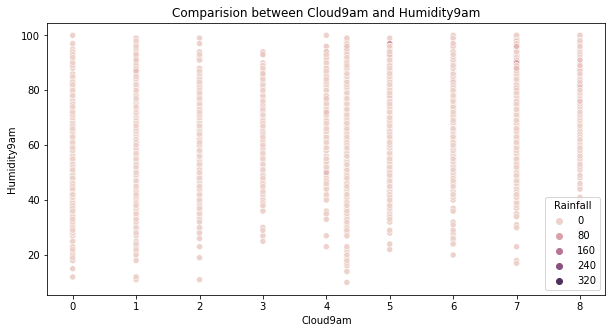

In [591]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Cloud9am and Humidity9am')
sns.scatterplot(data['Cloud9am'],data['Humidity9am'],hue=data['Rainfall']);

In [ ]:
#We can see data scattered in the intervals of time range and large increase in Humidity9am in these intervals along the Cloud9am axis

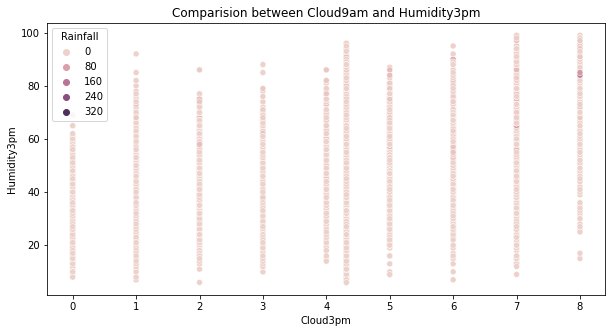

In [592]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Cloud9am and Humidity3pm')
sns.scatterplot(data['Cloud3pm'],data['Humidity3pm'],hue=data['Rainfall']);

In [ ]:
#We can see data scattered in the intervals of time range and large increase in Humidity3pm in these intervals along the Cloud3pm axis

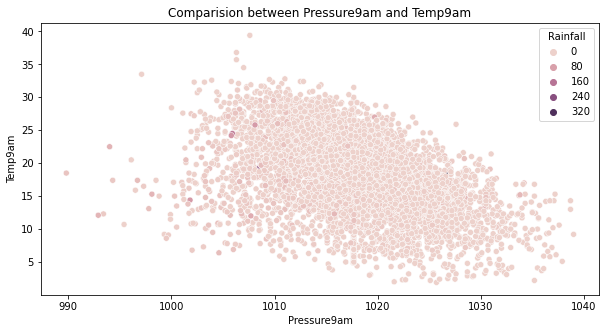

In [593]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Pressure9am and Temp9am')
sns.scatterplot(data['Pressure9am'],data['Temp9am'],hue=data['Rainfall']);

In [ ]:
#We can see large data set on the Pressure9am range of 1005 to 1035 and and Temp9am is getting increased in the range of 1005 to 1015 and then it is getting decreasing

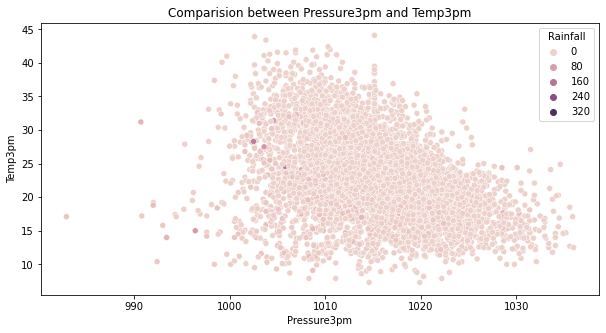

In [594]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Pressure3pm and Temp3pm')
sns.scatterplot(data['Pressure3pm'],data['Temp3pm'],hue=data['Rainfall']);

In [ ]:
#We can see large data set on the Pressure3pm range of 1005 to 1035 and and Temp3pm is getting increased in the range of 1005 to 1015 and then it is getting drastically decreasing

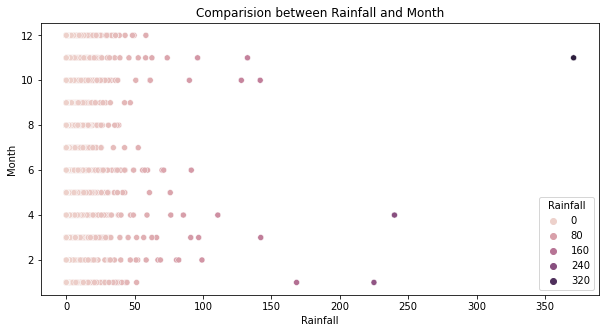

In [595]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Rainfall and Month')
sns.scatterplot(data['Rainfall'],data['Month'],hue=data['Rainfall']);

In [ ]:
#we can see an increase in the Rainfall along each months

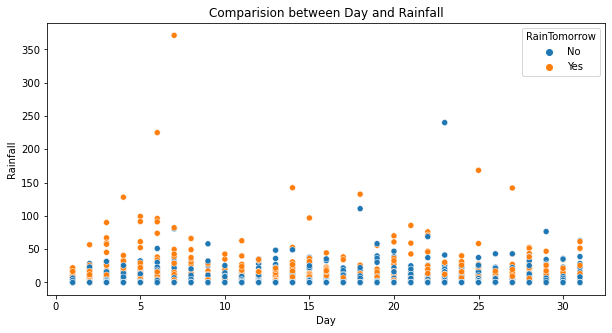

In [596]:
plt.figure(figsize=[10,5])
plt.title('Comparision between Day and Rainfall')
sns.scatterplot(data['Day'],data['Rainfall'],hue=data['RainTomorrow']);

In [ ]:
#we can see an increase in the Rainfall along each Days

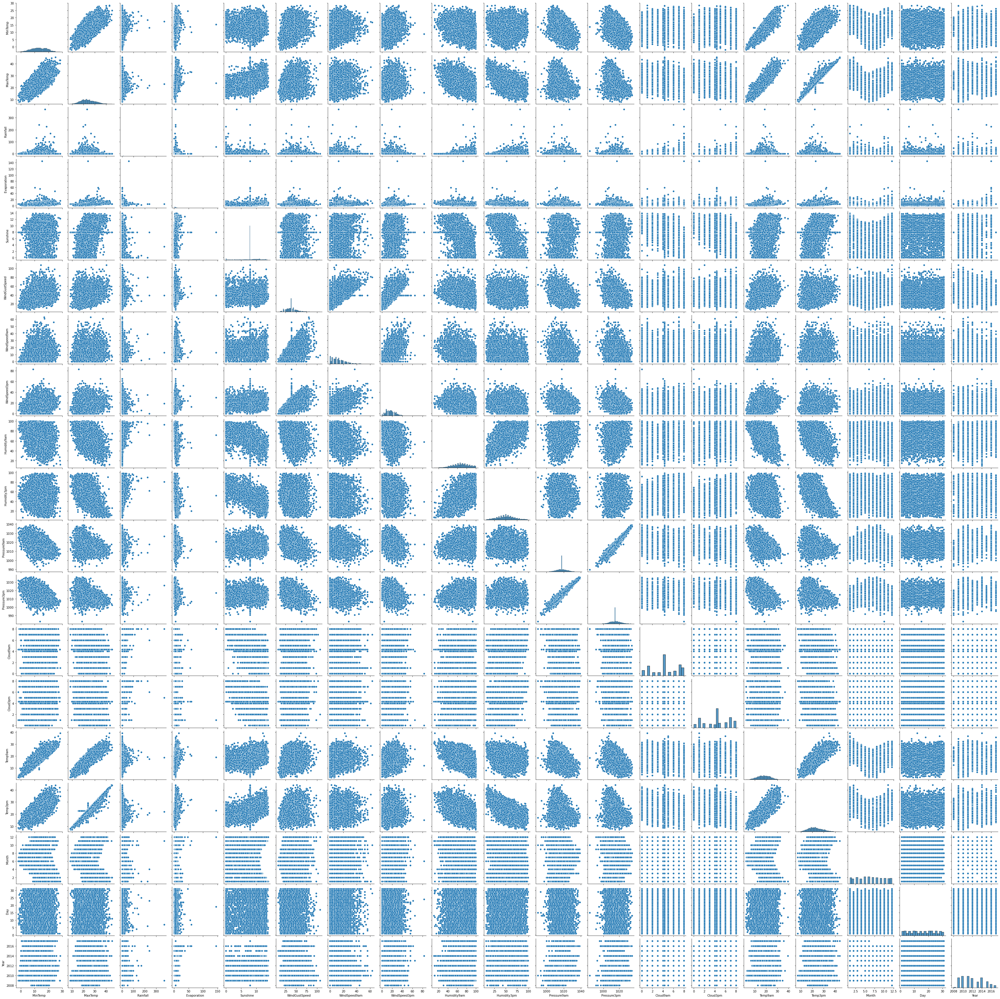

In [597]:
#pair ploting for data
sns.pairplot(data)

we can observe the linear relationship for few columns in the dataset

# Encoding

In [17]:
#creating the list for category columns to encode them
cat_col=['Location','WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow']

In [18]:
#initialising Encoder
OE=OrdinalEncoder()

In [19]:
#Encoding the columns

data['Location']=OE.fit_transform(data['Location'].values.reshape(-1,1))
data['WindGustDir']=OE.fit_transform(data['WindGustDir'].values.reshape(-1,1))
data['WindDir9am']=OE.fit_transform(data['WindDir9am'].values.reshape(-1,1))
data['WindDir3pm']=OE.fit_transform(data['WindDir3pm'].values.reshape(-1,1))
data['RainToday']=OE.fit_transform(data['RainToday'].values.reshape(-1,1))
data['RainTomorrow']=OE.fit_transform(data['RainTomorrow'].values.reshape(-1,1))


In [20]:

data.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day,Year
0,1.0,13.4,22.9,0.6,5.32063,7.924249,13.0,44.0,13.0,14.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.315844,16.9,21.8,0.0,0.0,12,1,2008
1,1.0,7.4,25.1,0.0,5.32063,7.924249,14.0,44.0,6.0,15.0,4.0,22.0,44.0,25.0,1010.6,1007.8,4.324085,4.315844,17.2,24.3,0.0,0.0,12,2,2008
2,1.0,12.9,25.7,0.0,5.32063,7.924249,15.0,46.0,13.0,15.0,19.0,26.0,38.0,30.0,1007.6,1008.7,4.324085,2.000000,21.0,23.2,0.0,0.0,12,3,2008
3,1.0,9.2,28.0,0.0,5.32063,7.924249,4.0,24.0,9.0,0.0,11.0,9.0,45.0,16.0,1017.6,1012.8,4.324085,4.315844,18.1,26.5,0.0,0.0,12,4,2008
4,1.0,17.5,32.3,1.0,5.32063,7.924249,13.0,41.0,1.0,7.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0,12,5,2008


In [21]:
data.shape

(6624, 25)

In [1252]:
data.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Month,Day,Year,Location_Adelaide,Location_Albury,Location_Brisbane,Location_CoffsHarbour,Location_Darwin,Location_Melbourne,Location_Newcastle,Location_Penrith,Location_PerthAirport,Location_Uluru,Location_Williamtown,Location_Wollongong,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_No,RainToday_Yes,RainTomorrow_No,RainTomorrow_Yes
0,13.4,22.9,0.6,5.32063,7.924249,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.315844,16.9,21.8,12,1,2008,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0
1,7.4,25.1,0.0,5.32063,7.924249,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,4.324085,4.315844,17.2,24.3,12,2,2008,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0
2,12.9,25.7,0.0,5.32063,7.924249,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,4.324085,2.000000,21.0,23.2,12,3,2008,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0
3,9.2,28.0,0.0,5.32063,7.924249,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,4.324085,4.315844,18.1,26.5,12,4,2008,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
4,17.5,32.3,1.0,5.32063,7.924249,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,12,5,2008,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0


In [40]:

cont_col=['MinTemp','MaxTemp','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am',
         'WindSpeed3pm','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm',
          'Cloud9am','Cloud3pm','Temp9am','Temp3pm','Month','Day','Year']

In [1253]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6624 entries, 0 to 8424
Data columns (total 83 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   MinTemp                6624 non-null   float64
 1   MaxTemp                6624 non-null   float64
 2   Rainfall               6624 non-null   float64
 3   Evaporation            6624 non-null   float64
 4   Sunshine               6624 non-null   float64
 5   WindGustSpeed          6624 non-null   float64
 6   WindSpeed9am           6624 non-null   float64
 7   WindSpeed3pm           6624 non-null   float64
 8   Humidity9am            6624 non-null   float64
 9   Humidity3pm            6624 non-null   float64
 10  Pressure9am            6624 non-null   float64
 11  Pressure3pm            6624 non-null   float64
 12  Cloud9am               6624 non-null   float64
 13  Cloud3pm               6624 non-null   float64
 14  Temp9am                6624 non-null   float64
 15  Temp

In [22]:
#Creating lsit with continous columns in the dataset
cont_col=['MinTemp','MaxTemp','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am',
         'WindSpeed3pm','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm',
          'Cloud9am','Cloud3pm','Temp9am','Temp3pm','Month','Day','Year','Rainfall']

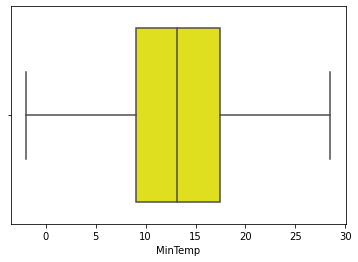

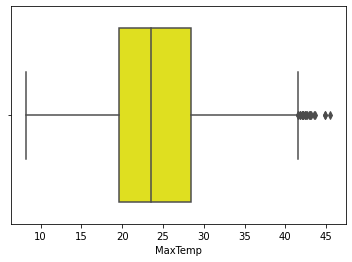

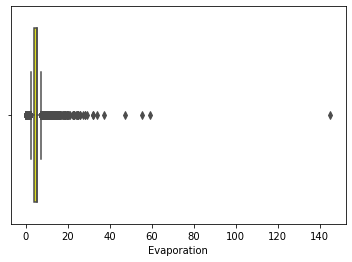

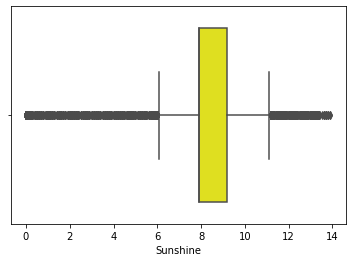

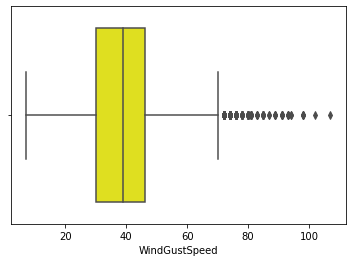

...

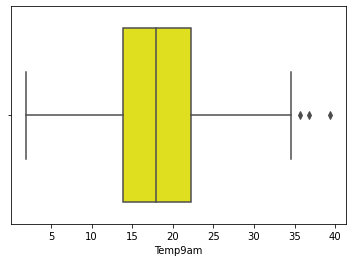

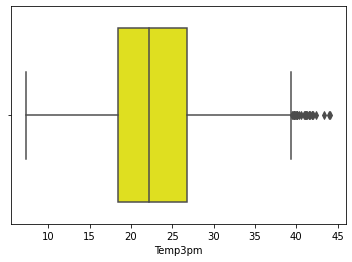

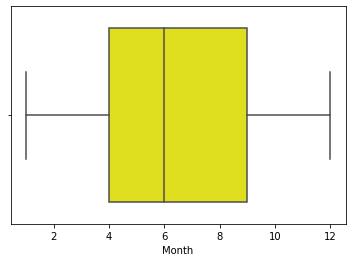

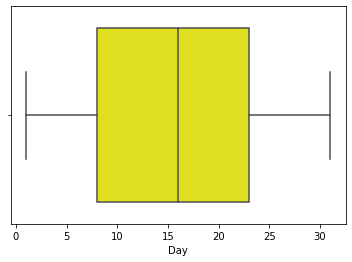

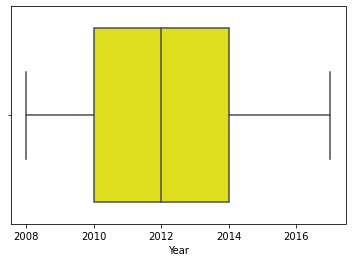

In [23]:
#defining Function for Boxplot
def bxplt(a):
    plt.figure()
    sns.boxplot(data[cont_col[a]],data=data,color='yellow')
for i in range(0,18):
    bxplt(i)

In [ ]:
#we can onbserve outliers in the 
'MinTemp','MaxTemp','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am',
         'WindSpeed3pm','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm',
          'Cloud9am','Cloud3pm','Temp9am','Temp3pm','Month','Day','Year','Rainfall'
        columns .

In [24]:
#creating dataset for removing Outliers from continous columns
feat=data[['MinTemp','MaxTemp','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am',
         'WindSpeed3pm','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm',
          'Cloud9am','Cloud3pm','Temp9am','Temp3pm','Month','Day','Year','Rainfall']]

In [25]:
#zscore
z1=np.abs(zscore(data))
threshold=3


In [26]:
#printing the outliers points in the dataset

print(np.where(z1>3))

(array([   8,   12,   12,   43,   43,   51,   51,   59,   59,   60,   60,
         61,   61,   61,   66,   67,   67,  122,  266,  270,  294,  379,
        379,  403,  404,  405,  429,  455,  458,  458,  555,  559,  560,
        560,  561,  594,  594,  595,  674,  674,  690,  704,  739,  739,
        761,  786,  787,  788,  793,  919,  919,  925,  939,  969,  970,
        970,  970,  998,  999, 1001, 1128, 1138, 1139, 1141, 1179, 1193,
       1227, 1231, 1254, 1255, 1347, 1401, 1402, 1469, 1470, 1471, 1503,
       1525, 1577, 1634, 1651, 1655, 1663, 1670, 1764, 1802, 1856, 1881,
       1886, 1928, 1999, 2011, 2026, 2056, 2090, 2098, 2164, 2177, 2195,
       2195, 2206, 2207, 2241, 2405, 2463, 2475, 2480, 2501, 2501, 2515,
       2567, 2650, 2651, 2708, 2798, 2806, 2815, 2815, 2821, 2825, 2829,
       2835, 2843, 2849, 2856, 2857, 2863, 2864, 2866, 2866, 2867, 2871,
       2875, 2877, 2885, 2891, 2899, 2905, 2913, 2919, 2927, 2933, 2938,
       2952, 2966, 2988, 3006, 3012, 3012, 3016, 3

In [27]:
#saving the data without outlier points 
df_new_1=data[(z1<3).all(axis=1)]


In [28]:
#chcking data loss
data_loss=((data.shape[0]-df_new_1.shape[0])/data.shape[0])*100
print(data_loss)

5.208333333333334


In [29]:
Q1=feat.quantile(.25)
Q3=feat.quantile(.75)

IQR=Q3-Q1


In [30]:
df_new_2=data[~(( data<(Q1-1.5*IQR ))|(data>(Q1+1.5*IQR))).any(axis=1)]

In [31]:
df_new_2.shape

(1342, 25)

In [32]:
((data.shape[0])-(df_new_2.shape[0]))/(data.shape[0])

0.7974033816425121

In [ ]:
#We can observe high Dataloss in the IQR method

In [33]:
#storing the outliers removed data in the dataset using Zscore
data=df_new_1

In [34]:
data.shape

(6279, 25)

In [1271]:
#distribution plot

def dtp(a):
    plt.figure()
    sns.distplot(data[cont_col[a]],color='brown',bins=5)
    

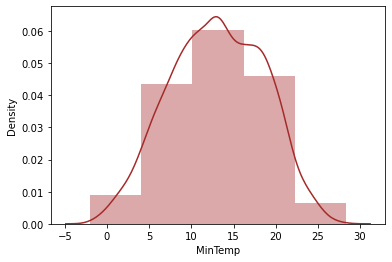

In [1272]:
dtp(0)

In [ ]:
#normal distrinution of the dataset is being observed


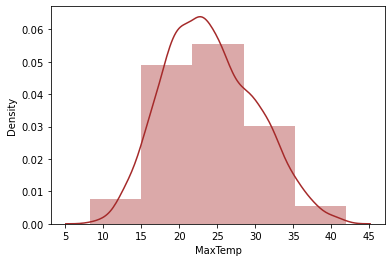

In [1273]:
dtp(1)

In [ ]:
#normal distrinution of the dataset is being observed


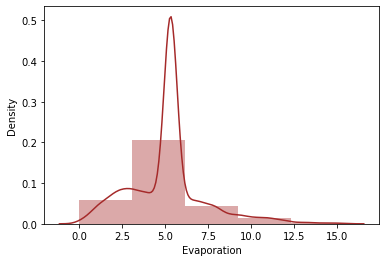

In [1274]:
dtp(2)

In [ ]:
#The data looks Right skewed.The building block is out of the normalised curve.

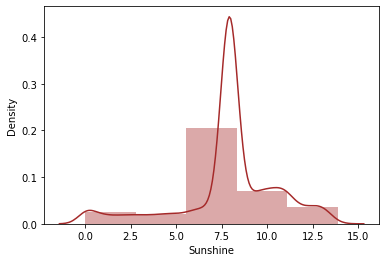

In [1275]:
dtp(3)

In [ ]:
#The data looks  skewed.The building block is out of the normalised curve.

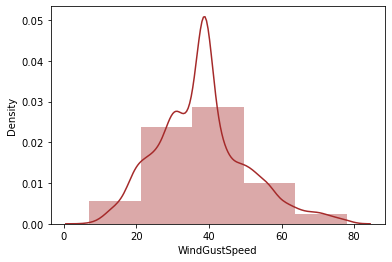

In [1276]:
dtp(4)

In [ ]:
#normal distrinution of the dataset is being observed


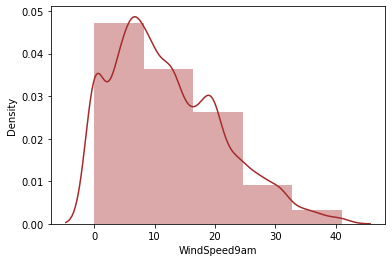

In [1277]:
dtp(5)

In [ ]:
#The data looks Right skewed.The building block is out of the normalised curve.

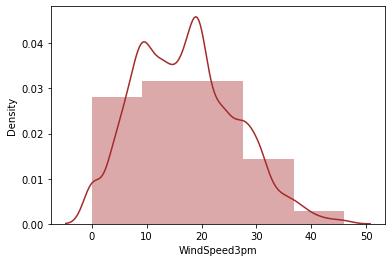

In [1278]:
dtp(6)

In [ ]:
#normal distrinution of the dataset is being observed


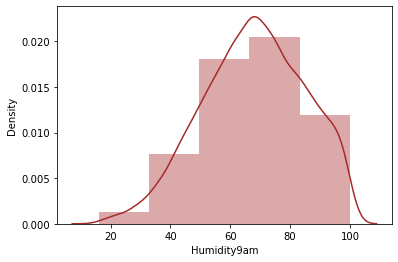

In [1279]:
dtp(7)

In [ ]:
#normal distrinution of the dataset is being observed


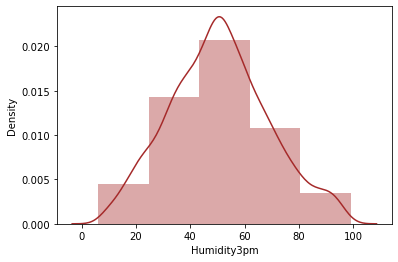

In [1280]:
dtp(8)

In [ ]:
#normal distrinution of the dataset is being observed


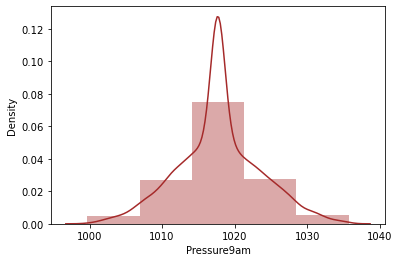

In [1281]:
dtp(9)

In [ ]:
#normal distrinution of the dataset is being observed


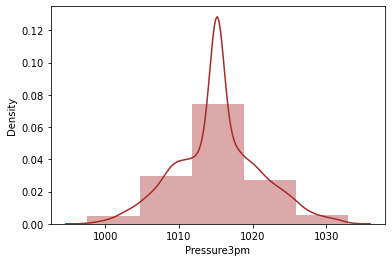

In [1282]:
dtp(10)

In [ ]:
#normal distrinution of the dataset is being observed


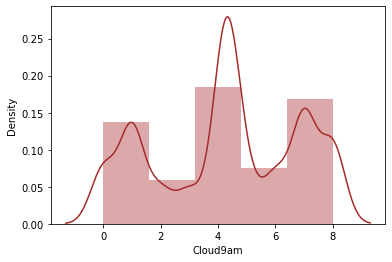

In [1283]:
dtp(11)

In [ ]:
#normal distrinution of the dataset is being observed


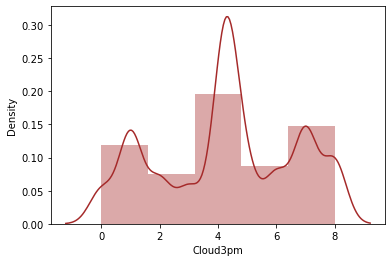

In [1284]:
dtp(12)

In [ ]:
#normal distrinution of the dataset is being observed


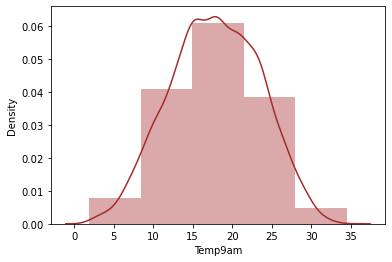

In [1285]:
dtp(13)

In [ ]:
#normal distrinution of the dataset is being observed


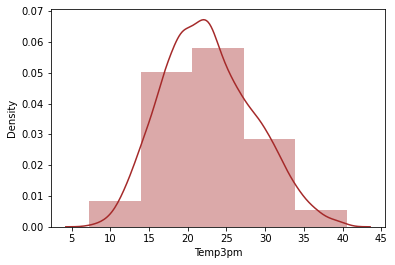

In [1286]:
dtp(14)

In [ ]:
#normal distrinution of the dataset is being observed


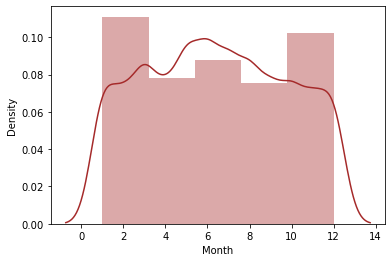

In [1287]:
dtp(15)

In [ ]:
#normal distrinution of the dataset is being observed


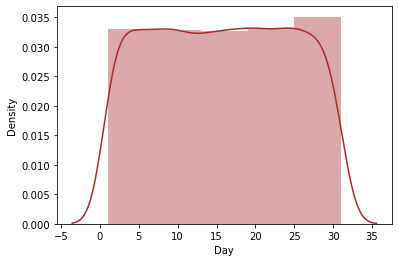

In [1288]:
dtp(16)

In [ ]:
#normal distrinution of the dataset is being observed


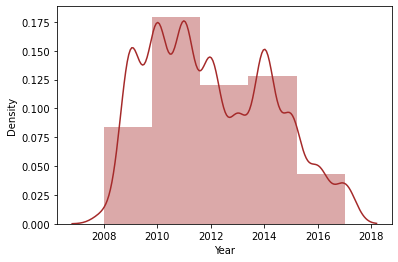

In [1289]:
dtp(17)

In [ ]:
#normal distrinution of the dataset is being observed


# Skewness Removal

In [35]:
#initialising X and y
X1=data.drop(['Rainfall'],axis=1)
y1=data.Rainfall

In [36]:
len(data.columns)

25

In [56]:
data.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Month', 'Day', 'Year'],
      dtype='object')

In [37]:
X1[cont_col].skew()

MinTemp         -0.071331
MaxTemp          0.265192
Evaporation      0.738409
Sunshine        -0.905650
WindGustSpeed    0.490928
WindSpeed9am     0.685150
WindSpeed3pm     0.347658
Humidity9am     -0.228942
Humidity3pm      0.161402
Pressure9am      0.060297
Pressure3pm      0.094359
Cloud9am        -0.194316
Cloud3pm        -0.143919
Temp9am         -0.072718
Temp3pm          0.286734
Month            0.035374
Day              0.002063
Year             0.356708
dtype: float64

In [38]:
#creating list with skewness column in continous values
features=['Evaporation','Sunshine','WindSpeed9am']

In [39]:
#Removing the slewness in the dataset
X1[features]=PowerTransformer(method='yeo-johnson').fit_transform(X1[features])

In [40]:
#chceking the updated skewness
X1[features].skew()

Evaporation     0.072391
Sunshine       -0.053352
WindSpeed9am   -0.132295
dtype: float64

In [61]:
#the Skewness in the datset os removed

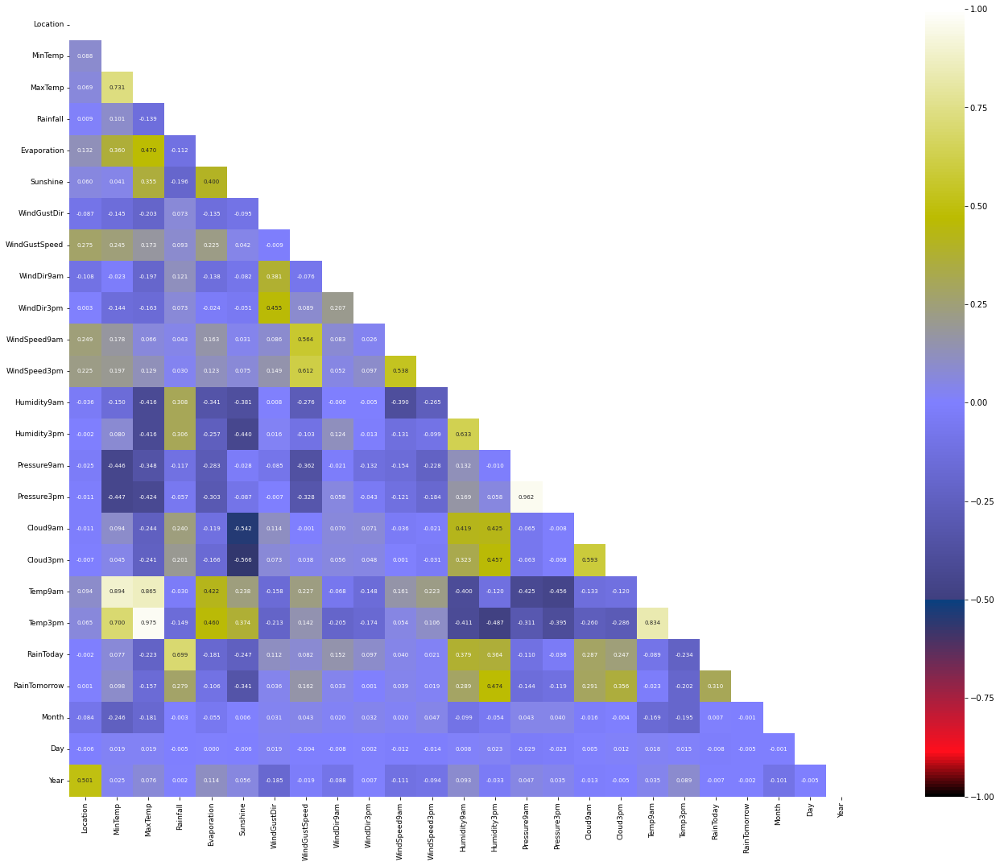

In [62]:
df_cor=data.corr()
upper_triangle = np.triu(df_cor)
plt.figure(figsize=(30,18))
sns.heatmap(df_cor, vmin=-1, vmax=1, annot=True, square=True, fmt='0.3f', 
            annot_kws={'size':7}, cmap="gist_stern", mask=upper_triangle)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
plt.show()

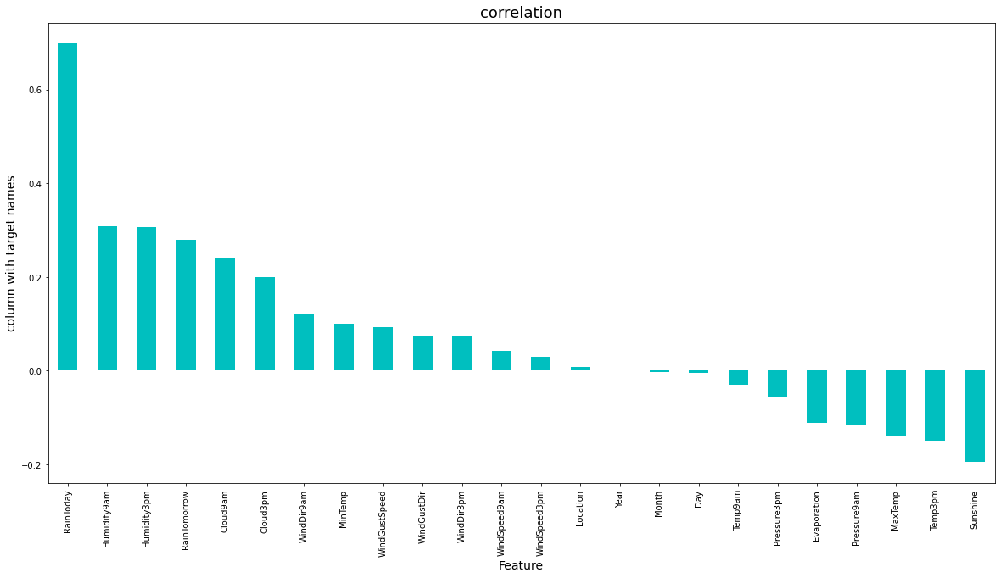

In [64]:
plt.figure(figsize=(20,10))
data.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('column with target names',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

In [65]:
X1.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day,Year
0,1.0,13.4,22.9,0.15666,-0.119451,13.0,44.0,13.0,14.0,0.910540,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.315844,16.9,21.8,0.0,0.0,12,1,2008
1,1.0,7.4,25.1,0.15666,-0.119451,14.0,44.0,6.0,15.0,-0.846052,22.0,44.0,25.0,1010.6,1007.8,4.324085,4.315844,17.2,24.3,0.0,0.0,12,2,2008
2,1.0,12.9,25.7,0.15666,-0.119451,15.0,46.0,13.0,15.0,0.828672,26.0,38.0,30.0,1007.6,1008.7,4.324085,2.000000,21.0,23.2,0.0,0.0,12,3,2008
3,1.0,9.2,28.0,0.15666,-0.119451,4.0,24.0,9.0,0.0,0.078182,9.0,45.0,16.0,1017.6,1012.8,4.324085,4.315844,18.1,26.5,0.0,0.0,12,4,2008
4,1.0,17.5,32.3,0.15666,-0.119451,13.0,41.0,1.0,7.0,-0.398617,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0,12,5,2008


# Scaling the data

In [41]:
scaler=StandardScaler()
X1_scaled=scaler.fit_transform(X1)
X1=pd.DataFrame(X1_scaled,columns=X1.columns)

# Checking for multicollinearity

In [42]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X1_scaled,i) for i in range(X1.shape[1])]
vif['features']=X1.columns
vif.sort_values('vif')

,vif,features
22,1.005552,Day
21,1.158210,Month
7,1.353647,WindDir9am
8,1.422508,WindDir3pm
19,1.430924,RainToday
20,1.500758,RainTomorrow
23,1.583923,Year
5,1.592737,WindGustDir
3,1.645218,Evaporation
0,1.657587,Location


In [ ]:
#we can see multicollinearity in the columns lets drop the columns iteratively

In [43]:
#dropping the multicollinear feature
X1.drop('Temp3pm',axis=1,inplace=True)

In [44]:
X1_scaled=scaler.fit_transform(X1)
X1=pd.DataFrame(X1_scaled,columns=X1.columns)

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X1_scaled,i) for i in range(X1.shape[1])]
vif['features']=X1.columns
vif.sort_values('vif')

,vif,features
21,1.005287,Day
20,1.141582,Month
7,1.352158,WindDir9am
8,1.422041,WindDir3pm
18,1.430446,RainToday
19,1.500753,RainTomorrow
22,1.583923,Year
5,1.588166,WindGustDir
3,1.643979,Evaporation
0,1.657541,Location


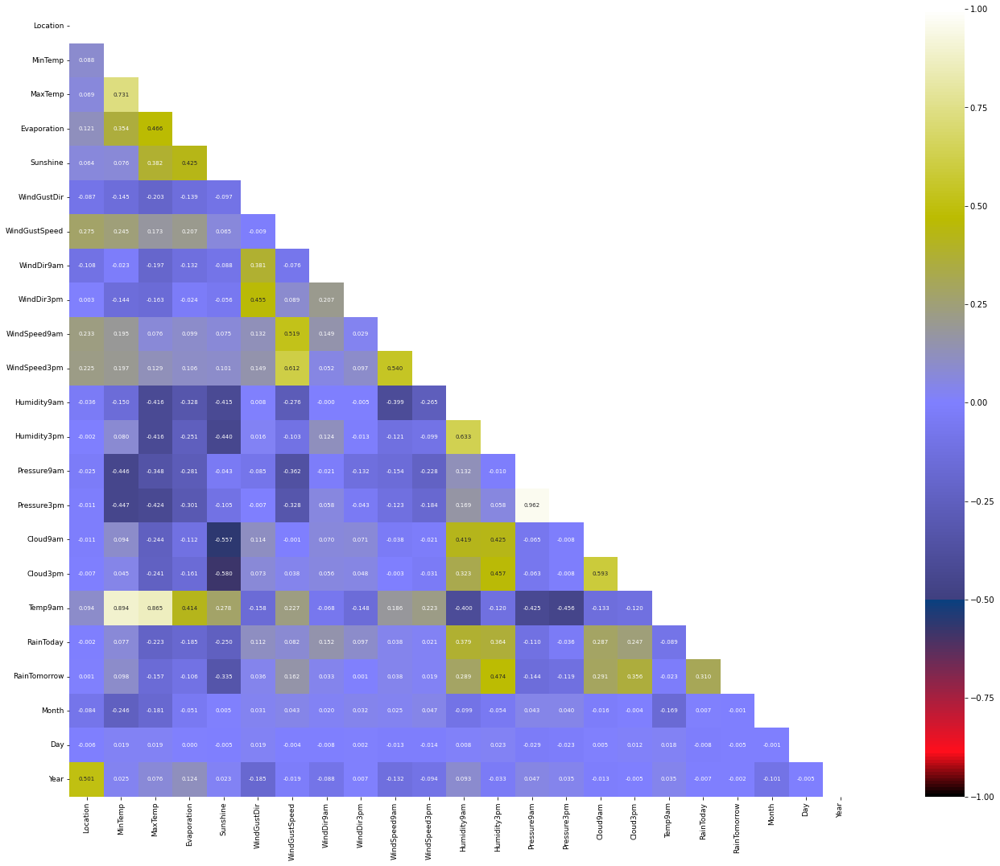

In [45]:
df_cor=X1.corr()
upper_triangle = np.triu(df_cor)
plt.figure(figsize=(30,18))
sns.heatmap(df_cor, vmin=-1, vmax=1, annot=True, square=True, fmt='0.3f', 
            annot_kws={'size':7}, cmap="gist_stern", mask=upper_triangle)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
plt.show()

In [46]:
#dropping the multicollinear feature
X1.drop('Pressure9am',axis=1,inplace=True)

In [47]:
X1_scaled=scaler.fit_transform(X1)
X1=pd.DataFrame(X1_scaled,columns=X1.columns)

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X1_scaled,i) for i in range(X1.shape[1])]
vif['features']=X1.columns
vif.sort_values('vif')

,vif,features
20,1.004226,Day
19,1.140460,Month
7,1.327959,WindDir9am
8,1.348999,WindDir3pm
17,1.409305,RainToday
13,1.467532,Pressure3pm
18,1.492147,RainTomorrow
5,1.573783,WindGustDir
21,1.582192,Year
3,1.624022,Evaporation


In [48]:
#dropping the multicollinear feature
X1.drop('Temp9am',axis=1,inplace=True)

In [49]:
X1_scaled=scaler.fit_transform(X1)
X1=pd.DataFrame(X1_scaled,columns=X1.columns)

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X1_scaled,i) for i in range(X1.shape[1])]
vif['features']=X1.columns
vif.sort_values('vif')

,vif,features
19,1.004042,Day
18,1.125334,Month
7,1.326958,WindDir9am
8,1.348930,WindDir3pm
16,1.407445,RainToday
13,1.464097,Pressure3pm
17,1.491721,RainTomorrow
5,1.571560,WindGustDir
20,1.576037,Year
3,1.605268,Evaporation


In [ ]:
#There is no multicollinearity found in features now.. we can proceed with data as the values are less than 10.

# Model Building

In [54]:
#X1,y1 already initialized
X1.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday,RainTomorrow,Month,Day,Year
0,-1.385992,0.074087,-0.190840,0.15666,-0.119451,1.226251,0.491012,1.318101,1.374238,0.910540,0.767610,0.201071,-1.556097,-1.447825,1.490615,0.017524,-0.543299,-0.53444,1.673678,-1.673784,-1.76748
1,-1.385992,-1.004761,0.174603,0.15666,-0.119451,1.417223,0.491012,-0.221441,1.597395,-0.846052,0.546864,-1.391052,-1.391550,-1.323920,0.014957,0.017524,-0.543299,-0.53444,1.673678,-1.560066,-1.76748
2,-1.385992,-0.015817,0.274270,0.15666,-0.119451,1.608195,0.654078,1.318101,1.597395,0.828672,0.988357,-1.744857,-1.117304,-1.164614,0.014957,-0.974443,-0.543299,-0.53444,1.673678,-1.446348,-1.76748
3,-1.385992,-0.681107,0.656325,0.15666,-0.119451,-0.492502,-1.139650,0.438363,-1.749970,0.078182,-0.887990,-1.332084,-1.885192,-0.438886,0.014957,0.017524,-0.543299,-0.53444,1.673678,-1.332630,-1.76748
4,-1.385992,0.811299,1.370601,0.15666,-0.119451,1.226251,0.246413,-1.321113,-0.187866,-0.398617,0.326117,0.849714,-0.952757,-1.642533,1.089176,1.595592,-0.543299,-0.53444,1.673678,-1.218912,-1.76748


In [55]:
#finding best random_state
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(X1,y1,test_size=.25,random_state=i)
    LR=LinearRegression()
    LR.fit(x_train,y_train)
    predrf=LR.predict(x_test)
    r2=r2_score(y_test,predrf)
    if r2>maxAccu:
        maxAccu=r2
        maxRS=i
print("Best accuracy is ",maxAccu," on random_state ",maxRS)


Best accuracy is  0.5383203393420065  on random_state  198


In [56]:
x_train,x_test,y_train,y_test=train_test_split(X1,y1,test_size=.25,random_state=maxRS)

In [57]:
#shapes of x and y (train,test)
x_train.shape

(4709, 21)

In [58]:
#shape of test features
x_test.shape

(1570, 21)

In [59]:
#shape of train features
y_train.shape

(4709,)

In [60]:
#shape of test label
y_test.shape

(1570,)

In [61]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import ExtraTreesRegressor

In [62]:
# different algorithm going to use

lr=LinearRegression()
ls=Lasso()
Rd=Ridge()
dtr=DecisionTreeRegressor()
rfr=RandomForestRegressor()
adr=AdaBoostRegressor()
gbr=GradientBoostingRegressor()
xgbr=XGBRegressor()
etr=ExtraTreesRegressor()

In [63]:
#code for Training and Prediction for linear,lasso,Ridge regression
def evaluate(x):
    mod=x
    mod.fit(x_train,y_train)
    pred_train=mod.predict(x_train)
    pred_test=mod.predict(x_test)
    

    print("r2_score for  test data is  {:.2f}%".format(r2_score(y_test,pred_test)*100),"\n")
    print("intercept is : ",mod.intercept_,"\n")
    print("Coefficient is  : ",mod.coef_,"\n")
    print("Score of trained data :",mod.score(x_train,y_train)*100,"\n")
    print("Score of test data :",mod.score(x_test,y_test)*100,"\n")
    
    print("Error")
    print("mean absolute error is : ",mean_absolute_error(y_test,pred_test))
    print("mean squared error is: ",mean_squared_error(y_test,pred_test))
    print("root mean squared error is: ",np.sqrt(mean_squared_error(y_test,pred_test)))
    plt.scatter(x=y_test,y=pred_test,color='r')
    plt.plot(y_test,y_test,color='b')

r2_score for  test data is  47.34% 

intercept is :  1.8703433812595014 

Coefficient is  :  [ 0.          0.         -0.         -0.         -0.          0.
  0.          0.          0.          0.          0.          0.
  0.         -0.          0.          0.          2.34127277  0.
 -0.         -0.          0.        ] 

Score of trained data : 43.165665689116096 

Score of test data : 47.340493228499405 

Error
mean absolute error is :  1.630039582856217
mean squared error is:  12.182176397172169
root mean squared error is:  3.490297465427864


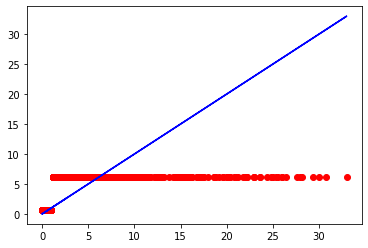

In [85]:
evaluate(ls)

Ridge()
r2_score for train data is 48.54%


r2_score for  test data is  53.83%


Error
mean absolute error :  1.5312815514821978
mean squared error :  10.680634387313175
mean squared error is:  3.268123985915035


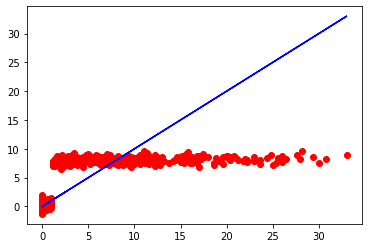

In [120]:
eval(Rd)

In [73]:
#code for Training and Prediction for other models

def eval(x):
    mod=x
    print(mod)
    #training the data
    mod.fit(x_train,y_train)
    #Predicting the data
    pred_train=mod.predict(x_train)
    pred=mod.predict(x_test)
    
    print("r2_score for train data is {:.2f}%".format(r2_score(y_train,pred_train)*100))
    print("\n")
    print("r2_score for  test data is  {:.2f}%".format(r2_score(y_test,pred)*100))
    
    print("\n")
    print("Error")
    print("mean absolute error : ",mean_absolute_error(y_test,pred))
    print("mean squared error : ",mean_squared_error(y_test,pred))
    print("mean squared error is: ",np.sqrt(mean_squared_error(y_test,pred)))
    plt.scatter(x=y_test,y=pred,color='r')
    plt.plot(y_test,y_test,color='b')


LinearRegression()
r2_score for train data is 48.54%


r2_score for  test data is  53.83%


Error
mean absolute error :  1.5312309173984042
mean squared error :  10.68043248017303
mean squared error is:  3.268093095395697


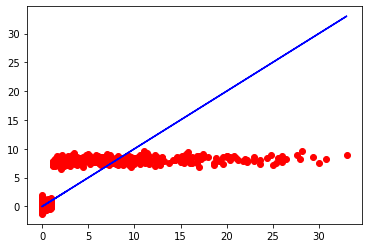

In [109]:
#calling linear model
eval(lr)

DecisionTreeRegressor()
r2_score for train data is 100.00%


r2_score for  test data is  8.07%


Error
mean absolute error :  1.6939490445859873
mean squared error :  21.266159235668788
mean squared error is:  4.611524610762561


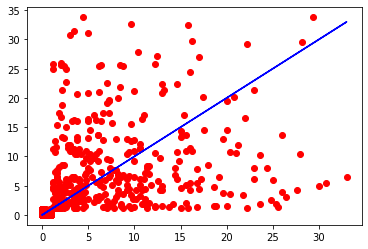

In [89]:
#calling DecisionTreeRegressor model
eval(dtr)

RandomForestRegressor()
r2_score for train data is 92.88%


r2_score for  test data is  51.24%


Error
mean absolute error :  1.334936942675159
mean squared error :  11.28122451656051
mean squared error is:  3.3587534170523012


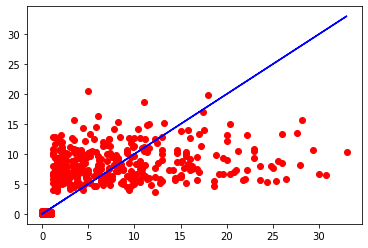

In [90]:
# RandomForestRegressor model
eval(rfr)

AdaBoostRegressor()
r2_score for train data is 38.50%


r2_score for  test data is  42.85%


Error
mean absolute error :  1.5623437110781255
mean squared error :  13.22191748953413
mean squared error is:  3.63619546910423


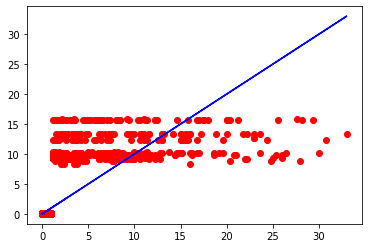

In [91]:
#calling AdaBoostRegressor model
eval(adr)

GradientBoostingRegressor()
r2_score for train data is 65.32%


r2_score for  test data is  52.04%


Error
mean absolute error :  1.3988553170072686
mean squared error :  11.095778356486836
mean squared error is:  3.3310326261516616


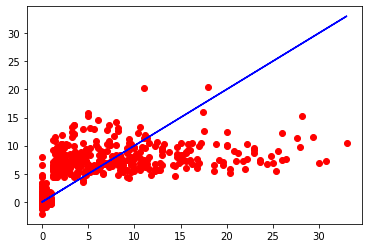

In [116]:
#calling GradientBoostingRegressor model
eval(gbr)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)
r2_score for train data is 99.15%


r2_score for  test data is  45.95%


Error
mean absolute error :  1.4905604097992924
mean squared error :  12.50391304752473
mean squared error is:  3.5360872511187744


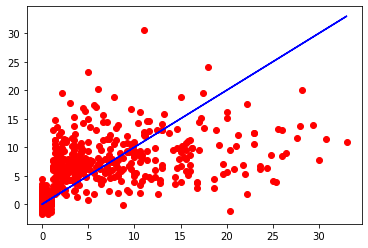

In [114]:
#calling XGBRegressor model
eval(xgbr)

ExtraTreesRegressor()
r2_score for train data is 100.00%


r2_score for  test data is  52.33%


Error
mean absolute error :  1.3340566878980893
mean squared error :  11.026779390445864
mean squared error is:  3.320659481254569


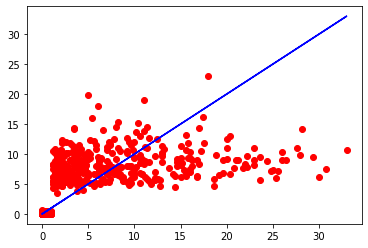

In [95]:
#calling ExtraTreesRegressor model
eval(etr)

In [96]:
from sklearn.model_selection import KFold

In [124]:
from numpy import absolute
model=[lr,dtr,rfr,adr,gbr,xgbr,etr]
for m in model:
    cv=KFold(n_splits=10,random_state=1,shuffle=True)
    score=cross_val_score(m,X1,y1,cv=cv,scoring="r2")
    print(m,"Cross val score is ",score*100)
    score=absolute(score)
    print("mean is ",score.mean()*100,"\n\n")

LinearRegression() Cross val score is  [44.99645285 55.2436458  49.71808453 45.56813068 53.71991106 54.56625287
 47.57217498 43.85791529 50.36383326 50.4290215 ]
mean is  49.60354228149722 


DecisionTreeRegressor() Cross val score is  [  6.53765022 -19.01732932  -2.7903795   24.33301094 -12.92223456
  19.14344055  15.80084095 -35.5350716   -7.95301922   7.31368507]
mean is  15.134666192862328 


RandomForestRegressor() Cross val score is  [46.92423211 46.83642096 46.76587678 51.51941428 53.9109738  58.50196551
 49.64878717 42.36258363 54.08037039 46.73853431]
mean is  49.72891589450047 


AdaBoostRegressor() Cross val score is  [30.06842819 42.31818493 27.62394707 39.9225047  41.71185596 51.61693506
 33.97831176 27.86834352 44.62022246 40.30989746]
mean is  38.00386310966088 


GradientBoostingRegressor() Cross val score is  [45.19098508 52.74820994 48.24177467 50.28940954 54.07326661 54.23879314
 46.8883196  47.47258582 55.2753112  46.5026686 ]
mean is  50.09213242054802 


XGBRegres

In [128]:
from numpy import absolute
model=[ls,Rd]
for m in model:
    cv=KFold(n_splits=10,random_state=1,shuffle=True)
    score=cross_val_score(m,X1,y1,cv=cv,scoring="r2")
    print(m,"Cross val score is ",score*100)
    score=absolute(score)
    print("mean is ",score.mean()*100,"\n\n")

Lasso() Cross val score is  [40.39548241 51.48404131 46.96912982 40.7126939  49.20254293 46.26325241
 41.87930628 41.82183202 44.30144197 44.57429211]
mean is  44.76040151440358 


Ridge() Cross val score is  [44.99702899 55.24409182 49.71913177 45.5684969  53.7209324  54.56391758
 47.5721944  43.86011728 50.36316575 50.42862425]
mean is  49.60377011517207 




We can observe underfitting among the models beacues of high skewness in the target variable

# RandomForestRegressor has the least difference between the cross validation and accuracy with 1.51%

# lets do hypertuning on the model

RandomForestRegressor has the least difference between the cross validation and accuracy,selcting this as the best model

In [64]:
#parameters of RandomForestRegressor 
    
grid_params = {
                    'bootstrap': [True, False],
                     'max_depth': [10, 15, 20, 25, 30, 35, 40],
                     'max_features': ['auto', 'sqrt',None],
                     'min_samples_leaf': [1, 10, 2],
                     'min_samples_split': [2, 10, 2],
                     'n_estimators': [50, 100, 150, 200, 250, 300, 350]
              }

In [65]:
#importing gridsearch 
from sklearn.model_selection import GridSearchCV

grid_sear= GridSearchCV(estimator=rfr,param_grid=grid_params,cv= 5,n_jobs=-1)

In [66]:
#training the models with parameters
grid_sear.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'max_depth': [10, 15, 20, 25, 30, 35, 40],
                         'max_features': ['auto', 'sqrt', None],
                         'min_samples_leaf': [1, 10, 2],
                         'min_samples_split': [2, 10, 2],
                         'n_estimators': [50, 100, 150, 200, 250, 300, 350]})

In [68]:
#best parameters
grid_sear.best_params_

{'bootstrap': True,
 'max_depth': 15,
 'max_features': 'auto',
 'min_samples_leaf': 10,
 'min_samples_split': 2,
 'n_estimators': 50}

In [69]:
#updating the models with updated parameters in hypertuned model
h_rfr=RandomForestRegressor(bootstrap=True,max_depth=15,max_features='auto',min_samples_leaf=10,
                            min_samples_split=2,n_estimators=50)


In [78]:
X1.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday,RainTomorrow,Month,Day,Year
0,-1.385992,0.074087,-0.190840,0.15666,-0.119451,1.226251,0.491012,1.318101,1.374238,0.910540,0.767610,0.201071,-1.556097,-1.447825,1.490615,0.017524,-0.543299,-0.53444,1.673678,-1.673784,-1.76748
1,-1.385992,-1.004761,0.174603,0.15666,-0.119451,1.417223,0.491012,-0.221441,1.597395,-0.846052,0.546864,-1.391052,-1.391550,-1.323920,0.014957,0.017524,-0.543299,-0.53444,1.673678,-1.560066,-1.76748
2,-1.385992,-0.015817,0.274270,0.15666,-0.119451,1.608195,0.654078,1.318101,1.597395,0.828672,0.988357,-1.744857,-1.117304,-1.164614,0.014957,-0.974443,-0.543299,-0.53444,1.673678,-1.446348,-1.76748
3,-1.385992,-0.681107,0.656325,0.15666,-0.119451,-0.492502,-1.139650,0.438363,-1.749970,0.078182,-0.887990,-1.332084,-1.885192,-0.438886,0.014957,0.017524,-0.543299,-0.53444,1.673678,-1.332630,-1.76748
4,-1.385992,0.811299,1.370601,0.15666,-0.119451,1.226251,0.246413,-1.321113,-0.187866,-0.398617,0.326117,0.849714,-0.952757,-1.642533,1.089176,1.595592,-0.543299,-0.53444,1.673678,-1.218912,-1.76748


RandomForestRegressor(max_depth=15, max_features='auto', min_samples_leaf=10,
                      n_estimators=50)
r2_score for train data is 68.96%


r2_score for  test data is  53.90%


Error
mean absolute error :  1.2967775301532245
mean squared error :  10.664945482622207
mean squared error is:  3.2657228116639363


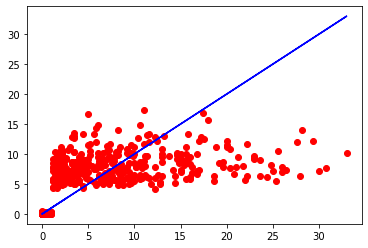

In [74]:
#calling hypertuned RandomForestRegressor model
eval(h_rfr)

# The hyper parameter tuning of RandomForestRegressor gives actual accuracy of 53.90 % and cross val of 49.72 %. Since there is accuracy increase of more than 1% for hypertuned parameter. The hypertuned model of RandomForestRegressor algorithm is selected for final output.

In [75]:
#saving the model
joblib.dump(h_rfr,"Rainfall_weather_Forecasting.obj")

['Rainfall_weather_Forecasting.obj']

In [76]:
#Lets Check loading the file 

Rainfall_weather_Forecasting_prediction=joblib.load("Rainfall_weather_Forecasting.obj")

In [77]:
pred=h_rfr.predict(x_test)
Conclusion=pd.DataFrame([Rainfall_weather_Forecasting_prediction.predict(x_test)[:],pred[:]],index=["Predicted","Original"])
Conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

After Training and Testing Eight algorithm model. The best accuracy model was determined as RandomForestRegressor (hypertuned model) with 53.90% true accuracy after all the data cleaning, pre-processing, training and prediction as well as evaluation phase